In [1]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch import Tensor

from PIL import Image, ImageFile
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy


%matplotlib notebook
import os
import numpy as np

import torch.utils.data as td 
import torchvision as tv

import matplotlib.pyplot as plt
import nntools as nt

import pandas as pd
import json
import random
import pickle

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


### Image loader

In [3]:
def image_loader(image_name):
    image = Image.open(image_name)
    
    loader = transforms.Compose([
    transforms.Resize((128,128)),  # scale imported image
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3,[0.5]*3)])  # transform it into a torch tensor

    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

In [4]:
style_img = image_loader("./vangogh2photo/testB/2014-08-02 19:18:15.jpg")
content_img = image_loader("./vangogh2photo/testA/00002.jpg")

In [5]:
def imshow(image, ax=plt, title=None):
    with torch.no_grad():
        i = image.clone()
        i = i.squeeze(0)
        i = i.to('cpu').numpy()
        i = np.moveaxis(i, [0, 1, 2], [2, 0, 1]) 
        i = (i + 1) / 2
        # clamp the image data to [0,1]
        i[i < 0] = 0
        i[i > 1] = 1 
        ax.figure()
        ax.imshow(i) 
        if title is not None:
            ax.title(title)
        ax.axis('off') 
        ax.pause(0.001)

<Figure size 432x288 with 0 Axes>

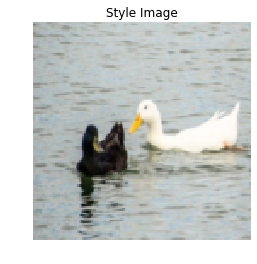

<Figure size 432x288 with 0 Axes>

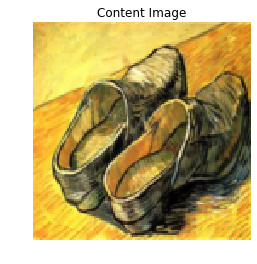

In [6]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

### Data Loader

In [7]:
dataset_root_dir = './vangogh2photo'

In [8]:
class VangoghDataset(td.Dataset):
    
    def __init__(self, root_dir, mode="train", image_size=(128, 128)):
        super(VangoghDataset, self).__init__()
        self.image_size = image_size
        self.mode = mode
        self.images_dir = os.path.join(root_dir, mode+"A")  
        self.data = [f for f in os.listdir(self.images_dir) if os.path.isfile(os.path.join(self.images_dir, f))]
    
    def __len__(self):
        return len(self.data)
    
    def __repr__(self):
        return "VangoghDataset(mode={}, image_size={})". \
            format(self.mode, self.image_size)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.data[idx]) 
        img = Image.open(img_path).convert('RGB')
        
        transform = tv.transforms.Compose([
                    tv.transforms.RandomCrop(self.image_size),
                    tv.transforms.RandomHorizontalFlip(),
                    tv.transforms.RandomRotation(30),
                    tv.transforms.ToTensor(),
                    tv.transforms.Normalize([0.5]*3,[0.5]*3)
                ])
        x = transform(img)
        return x

In [9]:
vangogh_dataset = VangoghDataset(dataset_root_dir)
vangogh_loader = td.DataLoader(vangogh_dataset, batch_size=1, shuffle=True, pin_memory= True)

In [10]:
vangogh_dataset.__len__()

400

In [11]:
class PhotoDataset(td.Dataset):
    
    def __init__(self, root_dir, mode="train",  image_size=(128, 128)):
        super(PhotoDataset, self).__init__()
        self.image_size = image_size
        self.mode = mode
        self.images_dir = os.path.join(root_dir, mode+"B")  
        self.data = [f for f in os.listdir(self.images_dir) if os.path.isfile(os.path.join(self.images_dir, f))]
        
    def __len__(self):
        return len(self.data)
    
    def __repr__(self):
        return "PhotoDataset(mode={}, image_size={})". \
            format(self.mode, self.image_size)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.data[idx]) 
        img = Image.open(img_path).convert('RGB')
        
        transform = tv.transforms.Compose([
                    tv.transforms.RandomCrop(self.image_size),
                    tv.transforms.RandomHorizontalFlip(),
                    tv.transforms.RandomRotation(30),
                    tv.transforms.ToTensor(),
                    tv.transforms.Normalize([0.5]*3,[0.5]*3)
                ])
        x = transform(img)
        return x

In [12]:
photo_dataset = PhotoDataset(dataset_root_dir)
photo_loader = td.DataLoader(photo_dataset, batch_size=1, shuffle=True, pin_memory= True)

In [13]:
photo_dataset.__len__()

6287

### Discriminator

In [14]:
class Discriminator(nn.Module):
    """
    70 × 70 PatchGAN 
    """
    def __init__(self, input_channels):
        super(Discriminator, self).__init__()
        self.model = []
        
        in_channels = input_channels
        out_channels = 64
        filter_size = 4
        
        # C64
        self.model.append(nn.Conv2d(in_channels,out_channels, filter_size, stride=2, padding=1))
        self.model.append(nn.LeakyReLU(negative_slope=0.2))
        
        # C128-C256-C512
        for _ in range(3):
            in_channels = out_channels
            out_channels *= 2
            self.model.append(nn.Conv2d(in_channels,out_channels, filter_size, stride=2, padding=1))
            self.model.append(nn.InstanceNorm2d(out_channels))
            self.model.append(nn.LeakyReLU(negative_slope=0.2))
            
        self.model.append(nn.ZeroPad2d((1, 0, 1, 0)))
        # After the last layer, we apply a convolution to produce a 1-dimensional output.
        self.model.append(nn.Conv2d(out_channels, 1, filter_size, padding=1))
        
        self.model = nn.Sequential(*self.model)
        
    def forward(self, x): 
        y = self.model(x)
        return y
    
    def criterion(self, dy, dgx):
        valid_y = torch.Tensor(np.ones(dy.shape)).to(device)
        l_1 = nn.functional.mse_loss(dy, valid_y)
        
        valid_yfX = Tensor(np.zeros(dgx.shape)).to(device)
        l_2 = nn.functional.mse_loss(dgx, valid_yfX)
        
        loss = l_1 + l_2
        return loss

### Generator

In [15]:
class ResidualBlock(nn.Module):
    """
    define residual block
    """
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        
        self.model = []
        
        self.model.append(nn.ReflectionPad2d(1))
        self.model.append(nn.Conv2d(in_channels,in_channels, 3))
        self.model.append(nn.InstanceNorm2d(in_channels))
        self.model.append(nn.ReLU())
        
        self.model.append(nn.ReflectionPad2d(1))
        self.model.append(nn.Conv2d(in_channels,in_channels, 3))
        self.model.append(nn.InstanceNorm2d(in_channels))
        self.model = nn.Sequential(*self.model)
        
    def forward(self, x):
#         return nn.ReLU(x + self.model(x))
        return x + self.model(x)

In [16]:
class Generator(nn.Module):
    """
    6 residual blocks for 128 × 128 training images
    """
    def __init__(self, input_channels):
        super(Generator, self).__init__()
        self.model = []
        
        in_channels = input_channels
        out_channels = 64
        
        # c7s1-64
        self.model.append(nn.ReflectionPad2d(in_channels))
        self.model.append(nn.Conv2d(in_channels,out_channels, 7))
        self.model.append(nn.InstanceNorm2d(out_channels))
        self.model.append(nn.ReLU())
        
        # d128, d256
        for _ in range(2):
            in_channels = out_channels
            out_channels *= 2
            self.model.append(nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1))
            self.model.append(nn.InstanceNorm2d(out_channels))
            self.model.append(nn.ReLU())
            
        # R256 * 6
        in_channels = out_channels # 256
        for _ in range(6):
            self.model.append(ResidualBlock(in_channels))
            
        # u128, u64
        for _ in range(2):
            out_channels //= 2
            self.model.append(nn.Upsample(scale_factor=2))
            self.model.append(nn.Conv2d(in_channels, out_channels, 3, stride=1, padding=1))
            self.model.append(nn.InstanceNorm2d(out_channels))
            self.model.append(nn.ReLU())
            in_channels = out_channels
        
        # c7s1-3
        out_channels = 3
        self.model.append(nn.ReflectionPad2d(input_channels))
        self.model.append(nn.Conv2d(in_channels,out_channels, 7))
        self.model.append(nn.Tanh())
        
        self.model = nn.Sequential(*self.model)
         
    def forward(self, x): 
        y = self.model(x)
        return y

### Loss

In [17]:
def AdversarialLoss(D, fake):
    """
    compute the adversarial loss L_GAN(G, DY , X, Y ) 
    """
    res = D(fake)
    valid = Tensor(np.ones(res.shape)).to(device)
    loss = nn.functional.mse_loss(res, valid)
    return loss

In [18]:
def CycleConsistencyLoss(G, F, fake_X, fake_Y, X, Y):
    """
    compute the cycle consistency loss L_cyc (G, F ) 
    """
    x_cycled = F(fake_Y)
    y_cycled = G(fake_X)
    loss1 = nn.functional.l1_loss(x_cycled, X)
    loss2 = nn.functional.l1_loss(y_cycled, Y)
    loss = loss1+loss2
    return loss/2

In [19]:
def fullLoss(G, F, D_X, D_Y, X, Y, idx, lam = 10.0):
    """
    compute the loss for cycle Gan
    """
    fake_X = F(Y)
    fake_Y = G(X)
    l_gan1 = AdversarialLoss(D_Y, fake_Y)
    l_gan2 = AdversarialLoss(D_X, fake_X)
    l_cyc = CycleConsistencyLoss(G, F, fake_X, fake_Y, X, Y)
    loss = l_gan1 + l_gan2 + lam * l_cyc
    
    if idx%50 == 0:
        print('Advers_loss_Dy_Gx: %.3f Advers_loss_Dx_Fy: %.3f Cyc_loss: %.3f' %
                            (l_gan1, l_gan2, l_cyc))
    plt_Advers_loss_Dy_Gx.append(l_gan1)
    plt_Advers_loss_Dx_Fy.append(l_gan2)
    plt_Cyc_loss.append(l_cyc)
    plt_loss.append(loss)
    return loss

### Image Buffer (reduce model ocillation)

In [20]:
class ImageHistoryBuffer(object):
    def __init__(self, max_size = 50):
        """
        :param max_size: Maximum number of images that can be stored in the image history buffer.
        """
        self.max_size = max_size
        self.image_history_buffer = []

    def get_from_image_history_buffer(self, img):
        """
        Get a random sample of images from the history buffer.
        """
        if len(self.image_history_buffer) < self.max_size:
            self.image_history_buffer.append(img)
            return img
        else:
            if random.uniform(0, 1) > 0.5:
                i = random.randint(0, self.max_size - 1)
                tmp = self.image_history_buffer[i].clone()
                self.image_history_buffer[i] = img
                return tmp
            else:
                return img

### Plot Losses

In [21]:
# loss ploting interval
interval = min(vangogh_dataset.__len__(), photo_dataset.__len__()) 

def show_loss():
    plt.xlabel("# of epochs")
    plt.ylabel("Adversarial_loss_Dy_Gx")
    plt.plot(plt_Advers_loss_Dy_Gx[0:len(plt_Advers_loss_Dy_Gx):interval], label = 'Adversarial_loss_Dy_Gx')
    plt.legend()
    plt.show()
    plt.pause(0.0001)
    plt.xlabel("# of epochs")
    plt.ylabel("Adversarial_loss_Dx_Fy")
    plt.plot(plt_Advers_loss_Dx_Fy[0:len(plt_Advers_loss_Dx_Fy):interval], label = 'Adversarial_loss_Dx_Fy')
    plt.legend()
    plt.show()
    plt.pause(0.0001)
    plt.xlabel("# of epochs")
    plt.ylabel("Cycle_loss")
    plt.plot(plt_Cyc_loss[0:len(plt_Cyc_loss):interval], label = 'Cycle_loss')
    plt.legend()
    plt.show()
    plt.pause(0.0001)
    plt.xlabel("# of epochs")
    plt.ylabel("Full_loss")
    plt.plot(plt_loss[0:len(plt_loss):interval], label = 'Full_loss')
    plt.legend()
    plt.show()
    plt.pause(0.0001)

### trainning process

In [22]:
def backprop_deep(G, F, D_X, D_Y, content_loader, style_loader, start=0, T=200, gamma=0.0002):
    params = list(G.parameters()) + list(F.parameters())
    optimizer_Ge = torch.optim.Adam(params, lr=gamma, betas=(0.5, 0.999))
    optimizer_Dx = torch.optim.Adam(D_X.parameters(), lr=gamma, betas=(0.5, 0.999))
    optimizer_Dy = torch.optim.Adam(D_Y.parameters(), lr=gamma, betas=(0.5, 0.999))
    
    buffer_X_fromY = ImageHistoryBuffer()
    buffer_Y_fromX = ImageHistoryBuffer()
    
    for epoch in range(start, T): 
        #  linearly decay the rate to zero over the next 100 epochs. 
        if epoch >= 100:
            for g in optimizer_Ge.param_groups:
                g['lr'] = gamma - gamma/100 * (epoch-100+1)
            for g in optimizer_Dx.param_groups:
                g['lr'] = gamma -  gamma/100 * (epoch-100+1)
            for g in optimizer_Dy.param_groups:
                g['lr'] = gamma - gamma/100 * (epoch-100+1)
               
        for idx, img in enumerate(zip(content_loader, style_loader)):
            X = img[0].to(device)
            Y = img[1].to(device)
            # Generators
            # Initialize the gradients to zero
            optimizer_Ge.zero_grad()
            # Forward propagation and Error evaluation
            loss_Ge = fullLoss(G, F, D_X, D_Y, X, Y, idx)
            # Back propagation
            loss_Ge.backward()
            # Parameter update
            optimizer_Ge.step()

            # Discriminator X
            # Initialize the gradients to zero
            optimizer_Dx.zero_grad()
            # Forward propagation and Error evaluation
            dx = D_X(X)
            # To reduce model oscillation, using a history of generated images rather than
            # the ones produced by the latest generators. 
            dfy = buffer_X_fromY.get_from_image_history_buffer(D_X(F(Y)))
            loss_Dx = D_X.criterion(dx, dfy)/2
            # Back propagation
            loss_Dx.backward(retain_graph=True)
            # Parameter update
            optimizer_Dx.step()

            # Discriminator Y
            # Initialize the gradients to zero
            optimizer_Dy.zero_grad()
            # Forward propagation and Error evaluation
            dy = D_Y(Y)
            dgx = buffer_X_fromY.get_from_image_history_buffer(D_Y(G(X)))
            loss_Dy = D_Y.criterion(dy, dgx)/2
            # Back propagation
            loss_Dy.backward(retain_graph=True)
            # Parameter update
            optimizer_Dy.step()
            
            
            if idx%50 == 0:
                print('[%d, %d] G_loss: %.3f Dx_loss: %.3f Dy_loss: %.3f\n' %
                        (epoch, idx, loss_Ge.item(), loss_Dx.item(), loss_Dy.item()))
            
            if idx%100 == 0:
                fake = G(content_img)
                imshow(fake, title='G(content_img) [%d, %d]'%(epoch, idx))
                
                cycled = F(fake)
                imshow(cycled, title='F(G(content_img)) [%d, %d]'%(epoch, idx))
                
        show_loss()
    
        # save model checkpoint
        torch.save({
            'G_state_dict': G.state_dict(),
            'F_state_dict': F.state_dict(),
            'Dx_state_dict':D_X.state_dict(),
            'Dy_state_dict':D_Y.state_dict(),
            }, saving_dir+"%d.pth" % (epoch))
        
        # save losses
        saved_losses = {"a":plt_Advers_loss_Dy_Gx, "b":plt_Advers_loss_Dx_Fy, "c":plt_Cyc_loss, "d":plt_loss}
        with open(saving_dir+'loss.backup.epoch_%d' % (epoch),'wb') as backup_file:
            pickle.dump(saved_losses, backup_file)

    return G, F, D_X, D_Y

### Generate model

In [23]:
channels = 3
G = Generator(channels).to(device)
F = Generator(channels).to(device)
D_X = Discriminator(channels).to(device)
D_Y = Discriminator(channels).to(device)

### Load model if necessary

In [24]:
def init_weights(m):
    """
    initial the weights using Gaussian distribution 
    """
    if type(m) == nn.Conv2d:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        m.bias.data.fill_(0.0)

In [25]:
#Flag = False
#epoch = -1
saving_dir = 'cycle_gan_vangogh2photo/'
Flag = True
epoch = 168
if Flag:
    # Load pretrained models
    checkpoint = torch.load(saving_dir+"%d.pth" % (epoch))
    G.load_state_dict(checkpoint['G_state_dict'])
    F.load_state_dict(checkpoint['F_state_dict'])
    D_X.load_state_dict(checkpoint['Dx_state_dict'])
    D_Y.load_state_dict(checkpoint['Dy_state_dict'])
    # load losses
    with open(saving_dir+'loss.backup.epoch_%d' % (epoch), 'rb') as backup_file:
        tmp = pickle.load(backup_file)
        plt_Advers_loss_Dy_Gx = tmp["a"]
        plt_Advers_loss_Dx_Fy = tmp["b"]
        plt_Cyc_loss = tmp["c"]
        plt_loss = tmp["d"]
#         plt_Advers_loss_Dy_Gx, plt_Advers_loss_Dx_Fy, plt_Cyc_loss, plt_loss = pickle.load( backup_file)
else:
    # Initialize weights
    G.apply(init_weights)
    F.apply(init_weights)
    D_X.apply(init_weights)
    D_Y.apply(init_weights)
    os.makedirs(saving_dir, exist_ok=True)
    # store the loss
    plt_Advers_loss_Dy_Gx = []
    plt_Advers_loss_Dx_Fy = []
    plt_Cyc_loss = []
    plt_loss = []

### Train

/opt/conda/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))


Advers_loss_Dy_Gx: 0.164 Advers_loss_Dx_Fy: 0.280 Cyc_loss: 0.129
[169, 0] G_loss: 1.734 Dx_loss: 0.189 Dy_loss: 0.227



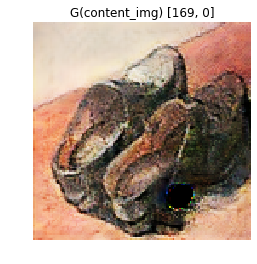

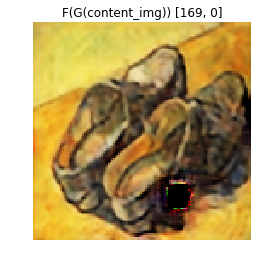

Advers_loss_Dy_Gx: 0.229 Advers_loss_Dx_Fy: 0.359 Cyc_loss: 0.116
[169, 50] G_loss: 1.752 Dx_loss: 0.226 Dy_loss: 0.276

Advers_loss_Dy_Gx: 0.241 Advers_loss_Dx_Fy: 0.212 Cyc_loss: 0.106
[169, 100] G_loss: 1.517 Dx_loss: 0.197 Dy_loss: 0.142



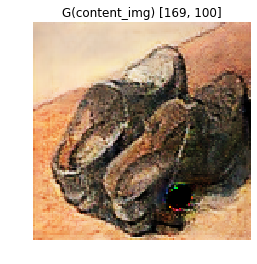

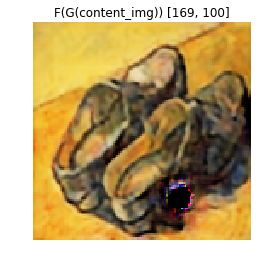

Advers_loss_Dy_Gx: 0.232 Advers_loss_Dx_Fy: 0.095 Cyc_loss: 0.102
[169, 150] G_loss: 1.352 Dx_loss: 0.376 Dy_loss: 0.235

Advers_loss_Dy_Gx: 0.091 Advers_loss_Dx_Fy: 0.453 Cyc_loss: 0.099
[169, 200] G_loss: 1.529 Dx_loss: 0.311 Dy_loss: 0.194



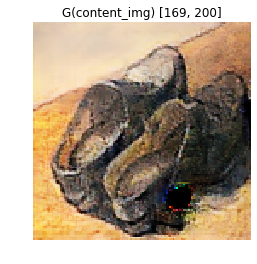

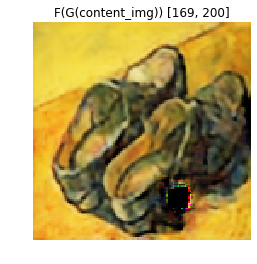

Advers_loss_Dy_Gx: 0.242 Advers_loss_Dx_Fy: 0.123 Cyc_loss: 0.153
[169, 250] G_loss: 1.897 Dx_loss: 0.261 Dy_loss: 0.237

Advers_loss_Dy_Gx: 0.324 Advers_loss_Dx_Fy: 0.213 Cyc_loss: 0.098
[169, 300] G_loss: 1.516 Dx_loss: 0.239 Dy_loss: 0.234



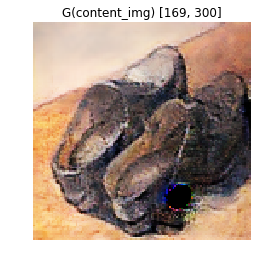

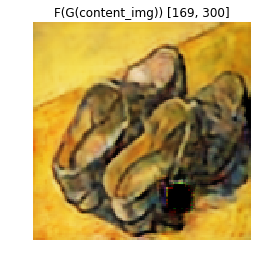

Advers_loss_Dy_Gx: 0.153 Advers_loss_Dx_Fy: 0.402 Cyc_loss: 0.193
[169, 350] G_loss: 2.487 Dx_loss: 0.274 Dy_loss: 0.233



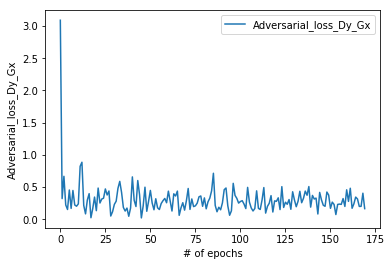

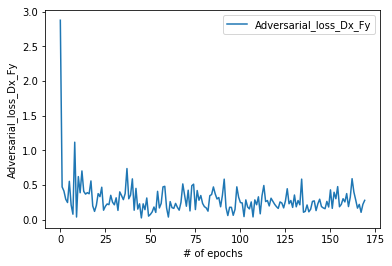

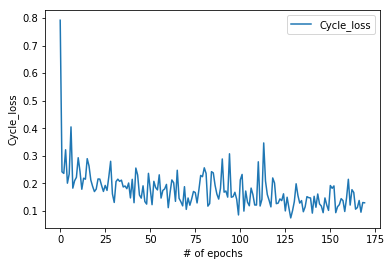

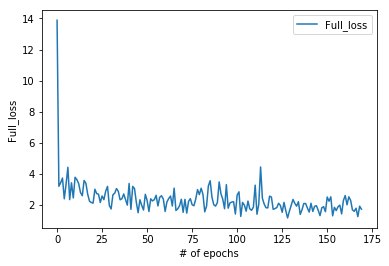

Advers_loss_Dy_Gx: 0.295 Advers_loss_Dx_Fy: 0.211 Cyc_loss: 0.157
[170, 0] G_loss: 2.075 Dx_loss: 0.238 Dy_loss: 0.304



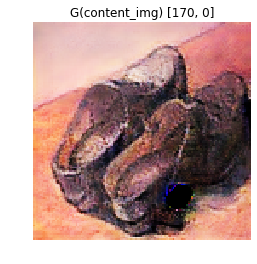

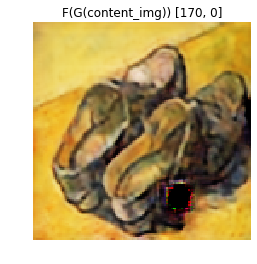

Advers_loss_Dy_Gx: 0.379 Advers_loss_Dx_Fy: 0.300 Cyc_loss: 0.106
[170, 50] G_loss: 1.739 Dx_loss: 0.255 Dy_loss: 0.292

Advers_loss_Dy_Gx: 0.240 Advers_loss_Dx_Fy: 0.129 Cyc_loss: 0.132
[170, 100] G_loss: 1.688 Dx_loss: 0.254 Dy_loss: 0.187



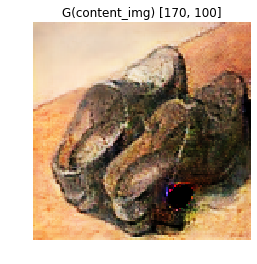

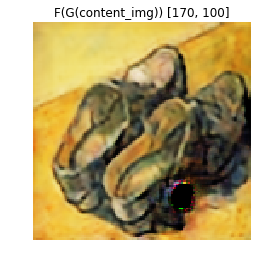

Advers_loss_Dy_Gx: 0.200 Advers_loss_Dx_Fy: 0.271 Cyc_loss: 0.116
[170, 150] G_loss: 1.627 Dx_loss: 0.243 Dy_loss: 0.243

Advers_loss_Dy_Gx: 0.323 Advers_loss_Dx_Fy: 0.499 Cyc_loss: 0.073
[170, 200] G_loss: 1.552 Dx_loss: 0.123 Dy_loss: 0.281



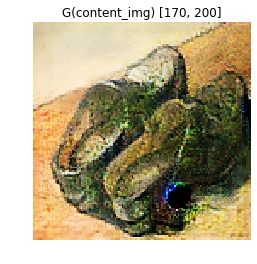

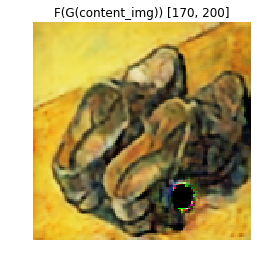

Advers_loss_Dy_Gx: 0.310 Advers_loss_Dx_Fy: 0.187 Cyc_loss: 0.119
[170, 250] G_loss: 1.683 Dx_loss: 0.243 Dy_loss: 0.316

Advers_loss_Dy_Gx: 0.331 Advers_loss_Dx_Fy: 0.265 Cyc_loss: 0.138
[170, 300] G_loss: 1.971 Dx_loss: 0.132 Dy_loss: 0.293



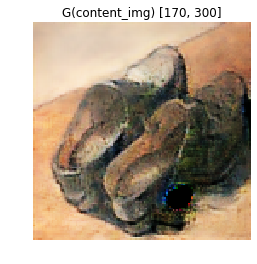

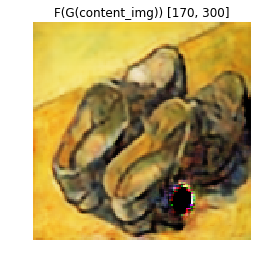

Advers_loss_Dy_Gx: 0.244 Advers_loss_Dx_Fy: 0.289 Cyc_loss: 0.101
[170, 350] G_loss: 1.540 Dx_loss: 0.369 Dy_loss: 0.267



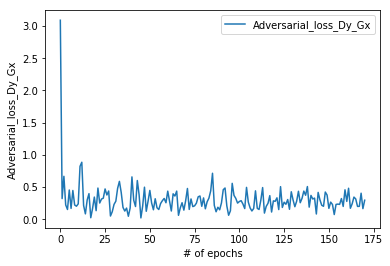

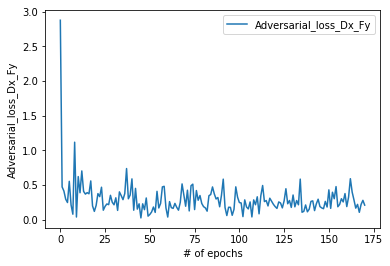

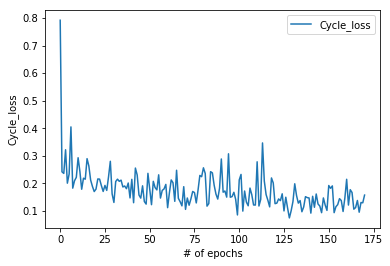

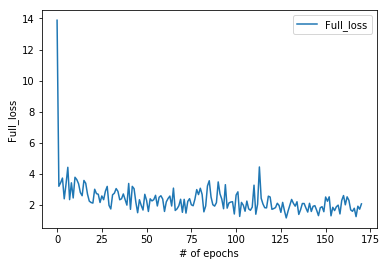

Advers_loss_Dy_Gx: 0.216 Advers_loss_Dx_Fy: 0.099 Cyc_loss: 0.100
[171, 0] G_loss: 1.320 Dx_loss: 0.269 Dy_loss: 0.272



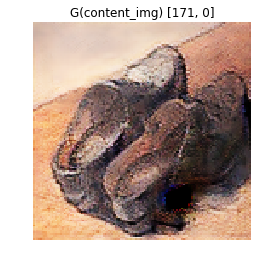

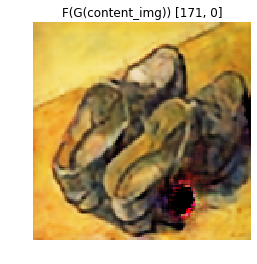

Advers_loss_Dy_Gx: 0.237 Advers_loss_Dx_Fy: 0.221 Cyc_loss: 0.097
[171, 50] G_loss: 1.428 Dx_loss: 0.270 Dy_loss: 0.225

Advers_loss_Dy_Gx: 0.319 Advers_loss_Dx_Fy: 0.234 Cyc_loss: 0.125
[171, 100] G_loss: 1.803 Dx_loss: 0.318 Dy_loss: 0.250



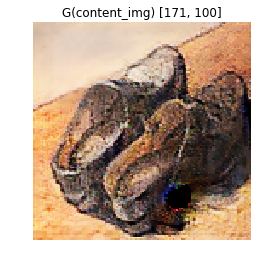

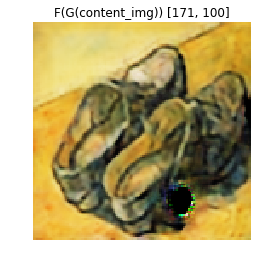

Advers_loss_Dy_Gx: 0.326 Advers_loss_Dx_Fy: 0.179 Cyc_loss: 0.121
[171, 150] G_loss: 1.719 Dx_loss: 0.329 Dy_loss: 0.320

Advers_loss_Dy_Gx: 0.380 Advers_loss_Dx_Fy: 0.184 Cyc_loss: 0.149
[171, 200] G_loss: 2.052 Dx_loss: 0.309 Dy_loss: 0.234



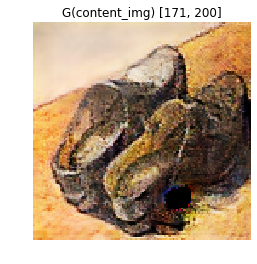

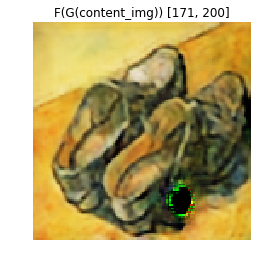

Advers_loss_Dy_Gx: 0.228 Advers_loss_Dx_Fy: 0.267 Cyc_loss: 0.101
[171, 250] G_loss: 1.500 Dx_loss: 0.166 Dy_loss: 0.184

Advers_loss_Dy_Gx: 0.178 Advers_loss_Dx_Fy: 0.231 Cyc_loss: 0.086
[171, 300] G_loss: 1.265 Dx_loss: 0.218 Dy_loss: 0.196



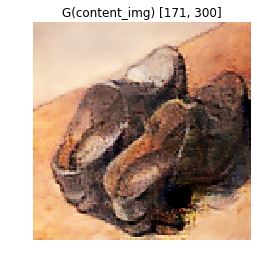

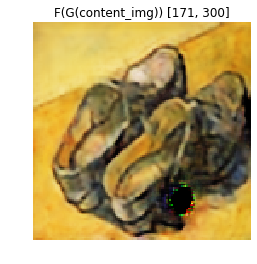

Advers_loss_Dy_Gx: 0.300 Advers_loss_Dx_Fy: 0.289 Cyc_loss: 0.134
[171, 350] G_loss: 1.932 Dx_loss: 0.229 Dy_loss: 0.234



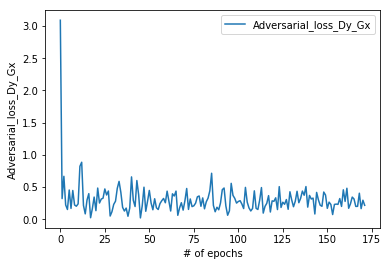

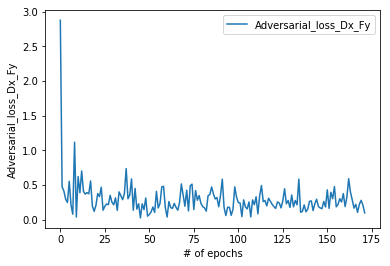

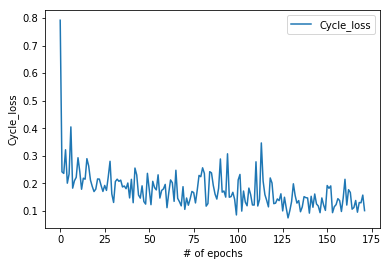

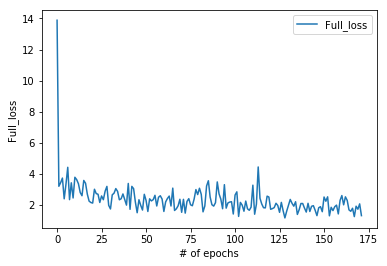

Advers_loss_Dy_Gx: 0.456 Advers_loss_Dx_Fy: 0.122 Cyc_loss: 0.129
[172, 0] G_loss: 1.872 Dx_loss: 0.223 Dy_loss: 0.190



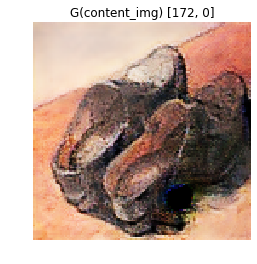

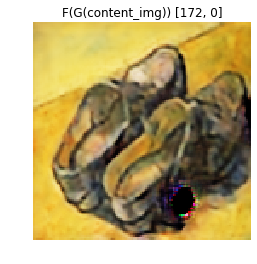

Advers_loss_Dy_Gx: 0.309 Advers_loss_Dx_Fy: 0.247 Cyc_loss: 0.117
[172, 50] G_loss: 1.726 Dx_loss: 0.147 Dy_loss: 0.233

Advers_loss_Dy_Gx: 0.255 Advers_loss_Dx_Fy: 0.095 Cyc_loss: 0.152
[172, 100] G_loss: 1.868 Dx_loss: 0.205 Dy_loss: 0.163



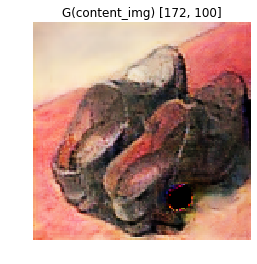

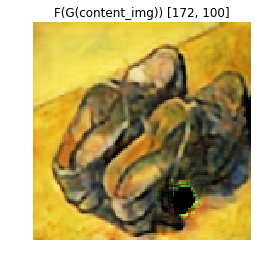

Advers_loss_Dy_Gx: 0.282 Advers_loss_Dx_Fy: 0.364 Cyc_loss: 0.166
[172, 150] G_loss: 2.309 Dx_loss: 0.199 Dy_loss: 0.213

Advers_loss_Dy_Gx: 0.193 Advers_loss_Dx_Fy: 0.487 Cyc_loss: 0.126
[172, 200] G_loss: 1.943 Dx_loss: 0.208 Dy_loss: 0.153



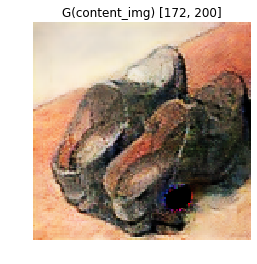

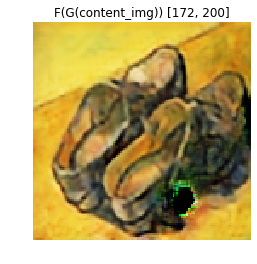

Advers_loss_Dy_Gx: 0.110 Advers_loss_Dx_Fy: 0.506 Cyc_loss: 0.137
[172, 250] G_loss: 1.982 Dx_loss: 0.318 Dy_loss: 0.121

Advers_loss_Dy_Gx: 0.314 Advers_loss_Dx_Fy: 0.399 Cyc_loss: 0.131
[172, 300] G_loss: 2.023 Dx_loss: 0.181 Dy_loss: 0.138



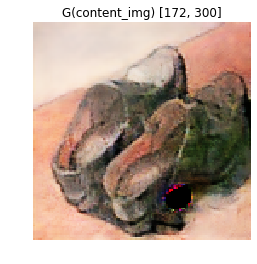

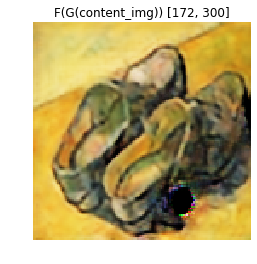

Advers_loss_Dy_Gx: 0.427 Advers_loss_Dx_Fy: 0.340 Cyc_loss: 0.095
[172, 350] G_loss: 1.721 Dx_loss: 0.284 Dy_loss: 0.253



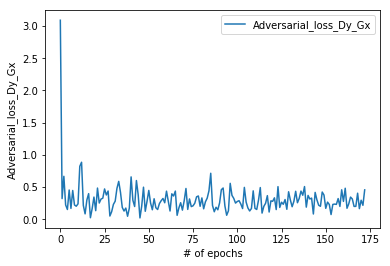

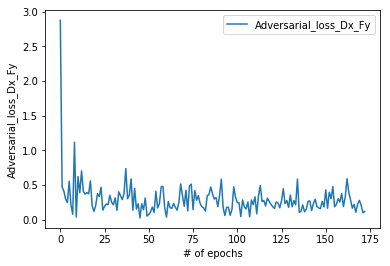

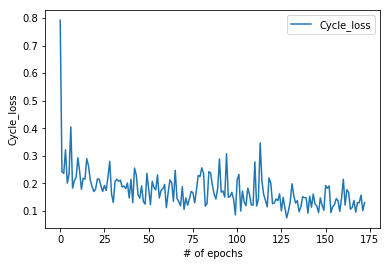

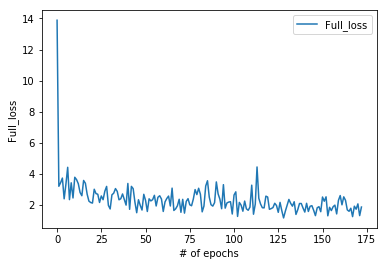

Advers_loss_Dy_Gx: 0.351 Advers_loss_Dx_Fy: 0.307 Cyc_loss: 0.092
[173, 0] G_loss: 1.578 Dx_loss: 0.143 Dy_loss: 0.125



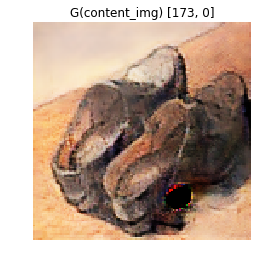

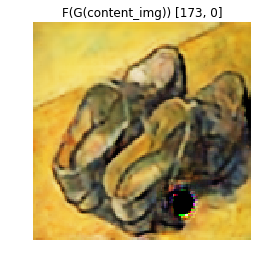

Advers_loss_Dy_Gx: 0.342 Advers_loss_Dx_Fy: 0.332 Cyc_loss: 0.084
[173, 50] G_loss: 1.513 Dx_loss: 0.210 Dy_loss: 0.129

Advers_loss_Dy_Gx: 0.179 Advers_loss_Dx_Fy: 0.153 Cyc_loss: 0.150
[173, 100] G_loss: 1.834 Dx_loss: 0.236 Dy_loss: 0.176



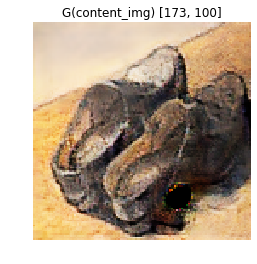

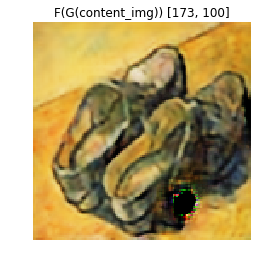

Advers_loss_Dy_Gx: 0.305 Advers_loss_Dx_Fy: 0.239 Cyc_loss: 0.107
[173, 150] G_loss: 1.615 Dx_loss: 0.194 Dy_loss: 0.215

Advers_loss_Dy_Gx: 0.325 Advers_loss_Dx_Fy: 0.402 Cyc_loss: 0.146
[173, 200] G_loss: 2.191 Dx_loss: 0.109 Dy_loss: 0.258



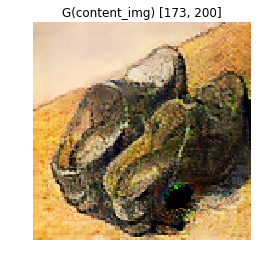

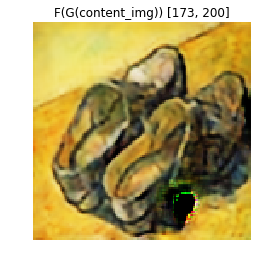

Advers_loss_Dy_Gx: 0.485 Advers_loss_Dx_Fy: 0.322 Cyc_loss: 0.199
[173, 250] G_loss: 2.797 Dx_loss: 0.250 Dy_loss: 0.175

Advers_loss_Dy_Gx: 0.270 Advers_loss_Dx_Fy: 0.320 Cyc_loss: 0.132
[173, 300] G_loss: 1.909 Dx_loss: 0.206 Dy_loss: 0.207



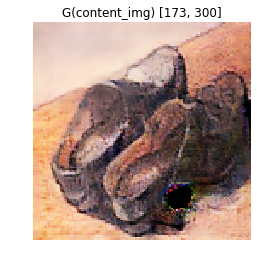

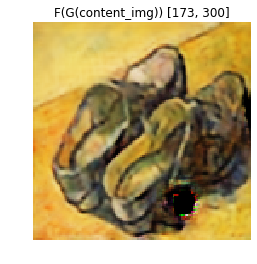

Advers_loss_Dy_Gx: 0.439 Advers_loss_Dx_Fy: 0.378 Cyc_loss: 0.141
[173, 350] G_loss: 2.224 Dx_loss: 0.244 Dy_loss: 0.141



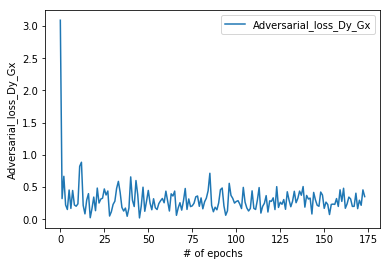

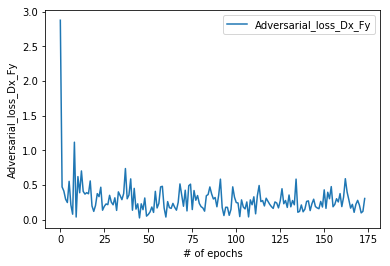

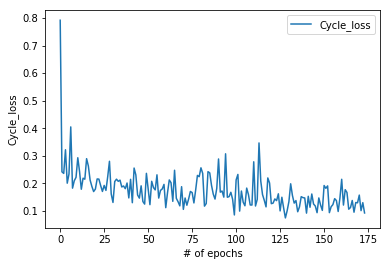

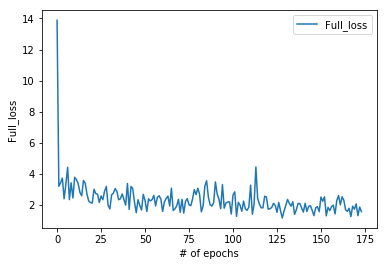

Advers_loss_Dy_Gx: 0.463 Advers_loss_Dx_Fy: 0.139 Cyc_loss: 0.088
[174, 0] G_loss: 1.482 Dx_loss: 0.174 Dy_loss: 0.262



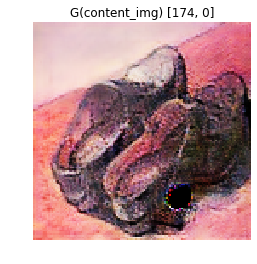

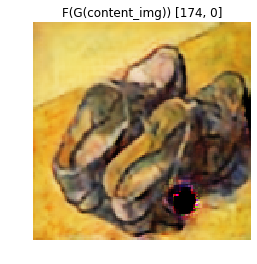

Advers_loss_Dy_Gx: 0.355 Advers_loss_Dx_Fy: 0.211 Cyc_loss: 0.118
[174, 50] G_loss: 1.750 Dx_loss: 0.258 Dy_loss: 0.169

Advers_loss_Dy_Gx: 0.214 Advers_loss_Dx_Fy: 0.349 Cyc_loss: 0.090
[174, 100] G_loss: 1.464 Dx_loss: 0.255 Dy_loss: 0.231



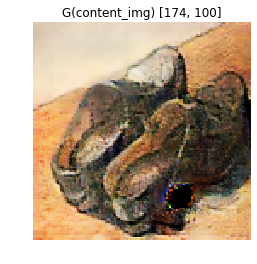

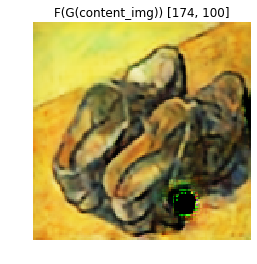

Advers_loss_Dy_Gx: 0.237 Advers_loss_Dx_Fy: 0.127 Cyc_loss: 0.083
[174, 150] G_loss: 1.194 Dx_loss: 0.283 Dy_loss: 0.243

Advers_loss_Dy_Gx: 0.382 Advers_loss_Dx_Fy: 0.460 Cyc_loss: 0.088
[174, 200] G_loss: 1.722 Dx_loss: 0.133 Dy_loss: 0.259



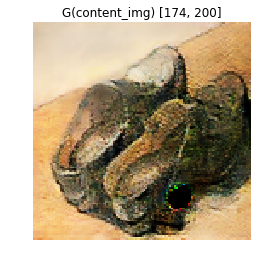

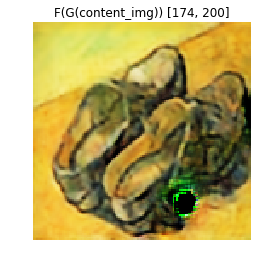

Advers_loss_Dy_Gx: 0.154 Advers_loss_Dx_Fy: 0.316 Cyc_loss: 0.109
[174, 250] G_loss: 1.560 Dx_loss: 0.240 Dy_loss: 0.259

Advers_loss_Dy_Gx: 0.129 Advers_loss_Dx_Fy: 0.065 Cyc_loss: 0.146
[174, 300] G_loss: 1.657 Dx_loss: 0.332 Dy_loss: 0.211



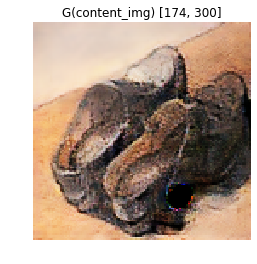

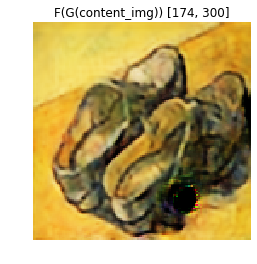

Advers_loss_Dy_Gx: 0.229 Advers_loss_Dx_Fy: 0.308 Cyc_loss: 0.105
[174, 350] G_loss: 1.592 Dx_loss: 0.233 Dy_loss: 0.254



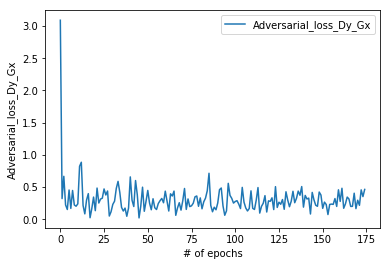

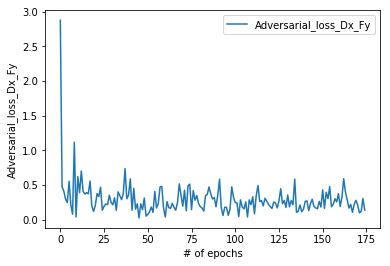

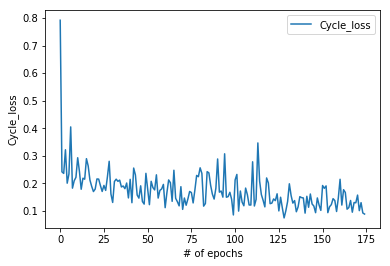

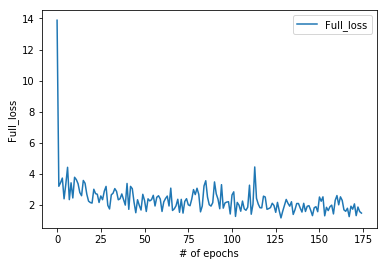

Advers_loss_Dy_Gx: 0.232 Advers_loss_Dx_Fy: 0.235 Cyc_loss: 0.169
[175, 0] G_loss: 2.158 Dx_loss: 0.304 Dy_loss: 0.154



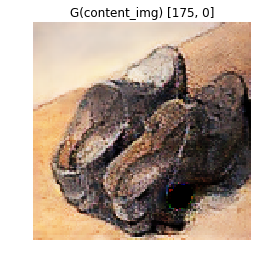

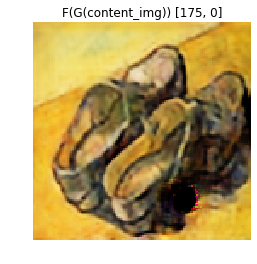

Advers_loss_Dy_Gx: 0.173 Advers_loss_Dx_Fy: 0.250 Cyc_loss: 0.102
[175, 50] G_loss: 1.440 Dx_loss: 0.192 Dy_loss: 0.204

Advers_loss_Dy_Gx: 0.317 Advers_loss_Dx_Fy: 0.221 Cyc_loss: 0.127
[175, 100] G_loss: 1.804 Dx_loss: 0.202 Dy_loss: 0.302



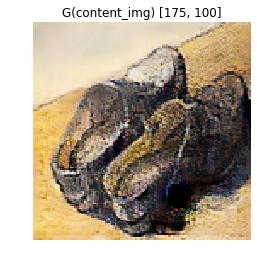

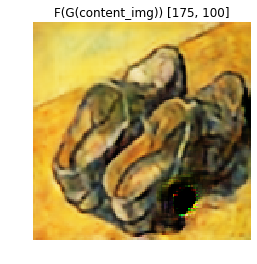

Advers_loss_Dy_Gx: 0.279 Advers_loss_Dx_Fy: 0.283 Cyc_loss: 0.213
[175, 150] G_loss: 2.691 Dx_loss: 0.149 Dy_loss: 0.094

Advers_loss_Dy_Gx: 0.178 Advers_loss_Dx_Fy: 0.442 Cyc_loss: 0.189
[175, 200] G_loss: 2.510 Dx_loss: 0.185 Dy_loss: 0.082



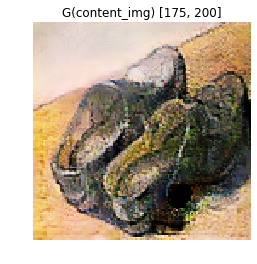

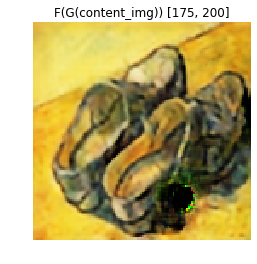

Advers_loss_Dy_Gx: 0.257 Advers_loss_Dx_Fy: 0.220 Cyc_loss: 0.126
[175, 250] G_loss: 1.736 Dx_loss: 0.223 Dy_loss: 0.125

Advers_loss_Dy_Gx: 0.176 Advers_loss_Dx_Fy: 0.317 Cyc_loss: 0.116
[175, 300] G_loss: 1.654 Dx_loss: 0.234 Dy_loss: 0.333



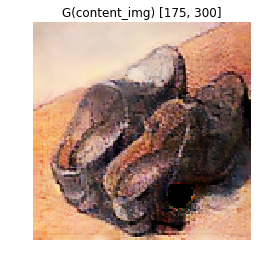

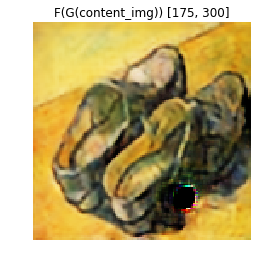

Advers_loss_Dy_Gx: 0.425 Advers_loss_Dx_Fy: 0.157 Cyc_loss: 0.115
[175, 350] G_loss: 1.728 Dx_loss: 0.136 Dy_loss: 0.284



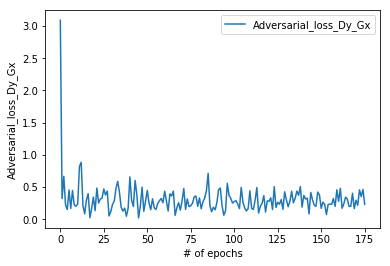

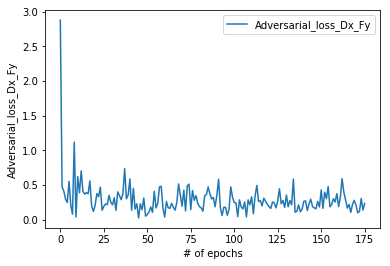

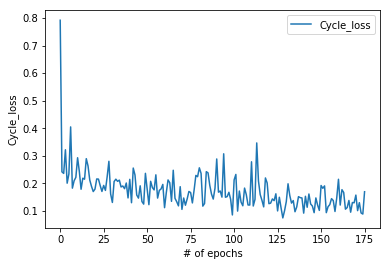

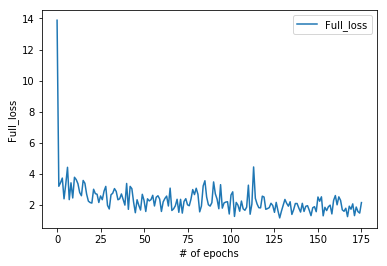

Advers_loss_Dy_Gx: 0.361 Advers_loss_Dx_Fy: 0.234 Cyc_loss: 0.094
[176, 0] G_loss: 1.539 Dx_loss: 0.184 Dy_loss: 0.201



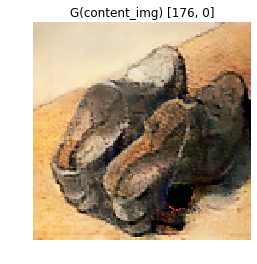

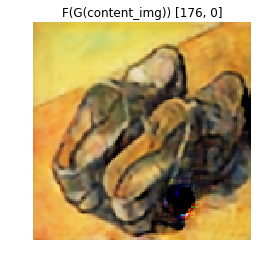

Advers_loss_Dy_Gx: 0.215 Advers_loss_Dx_Fy: 0.303 Cyc_loss: 0.139
[176, 50] G_loss: 1.908 Dx_loss: 0.196 Dy_loss: 0.245

Advers_loss_Dy_Gx: 0.208 Advers_loss_Dx_Fy: 0.345 Cyc_loss: 0.186
[176, 100] G_loss: 2.413 Dx_loss: 0.219 Dy_loss: 0.193



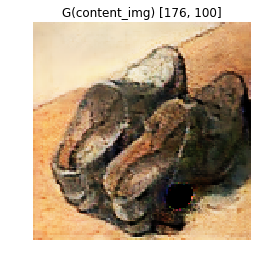

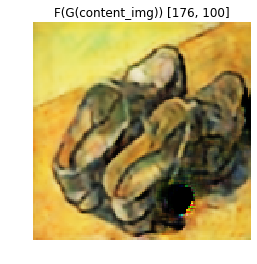

Advers_loss_Dy_Gx: 0.313 Advers_loss_Dx_Fy: 0.361 Cyc_loss: 0.090
[176, 150] G_loss: 1.576 Dx_loss: 0.236 Dy_loss: 0.234

Advers_loss_Dy_Gx: 0.122 Advers_loss_Dx_Fy: 0.136 Cyc_loss: 0.089
[176, 200] G_loss: 1.152 Dx_loss: 0.277 Dy_loss: 0.388



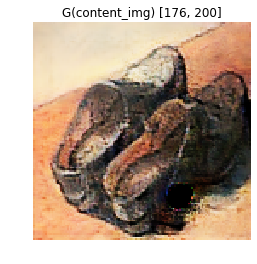

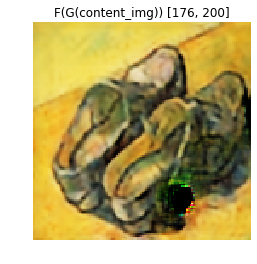

Advers_loss_Dy_Gx: 0.144 Advers_loss_Dx_Fy: 0.200 Cyc_loss: 0.097
[176, 250] G_loss: 1.317 Dx_loss: 0.228 Dy_loss: 0.363

Advers_loss_Dy_Gx: 0.220 Advers_loss_Dx_Fy: 0.192 Cyc_loss: 0.084
[176, 300] G_loss: 1.254 Dx_loss: 0.217 Dy_loss: 0.172



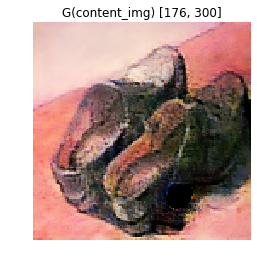

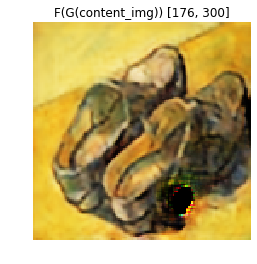

Advers_loss_Dy_Gx: 0.344 Advers_loss_Dx_Fy: 0.195 Cyc_loss: 0.121
[176, 350] G_loss: 1.745 Dx_loss: 0.235 Dy_loss: 0.278



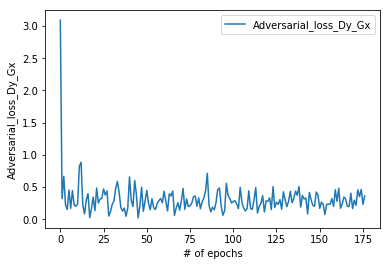

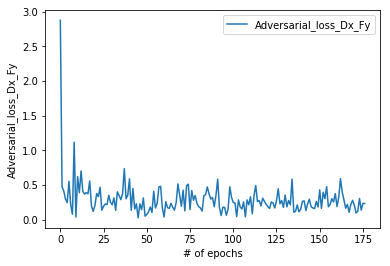

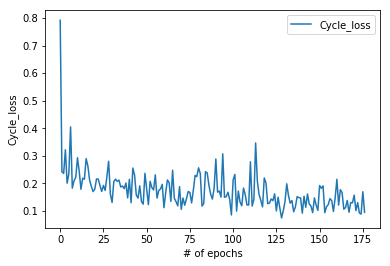

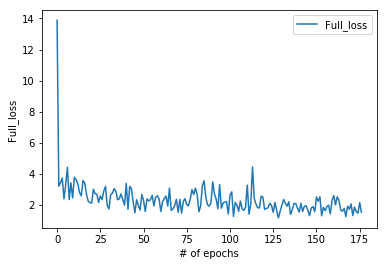

Advers_loss_Dy_Gx: 0.142 Advers_loss_Dx_Fy: 0.229 Cyc_loss: 0.076
[177, 0] G_loss: 1.135 Dx_loss: 0.271 Dy_loss: 0.190



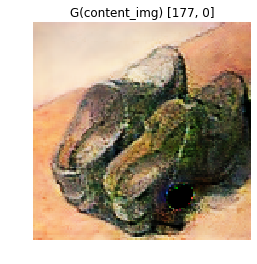

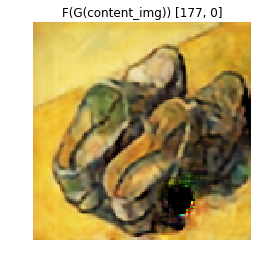

Advers_loss_Dy_Gx: 0.396 Advers_loss_Dx_Fy: 0.083 Cyc_loss: 0.103
[177, 50] G_loss: 1.504 Dx_loss: 0.181 Dy_loss: 0.228

Advers_loss_Dy_Gx: 0.147 Advers_loss_Dx_Fy: 0.254 Cyc_loss: 0.103
[177, 100] G_loss: 1.426 Dx_loss: 0.073 Dy_loss: 0.193



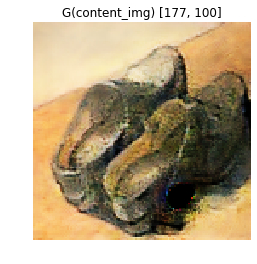

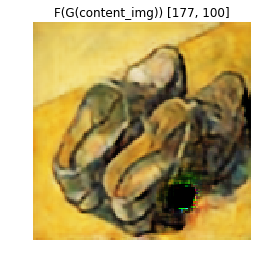

Advers_loss_Dy_Gx: 0.441 Advers_loss_Dx_Fy: 0.297 Cyc_loss: 0.076
[177, 150] G_loss: 1.494 Dx_loss: 0.198 Dy_loss: 0.198

Advers_loss_Dy_Gx: 0.284 Advers_loss_Dx_Fy: 0.275 Cyc_loss: 0.126
[177, 200] G_loss: 1.815 Dx_loss: 0.219 Dy_loss: 0.392



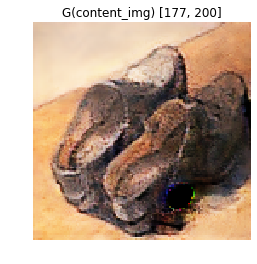

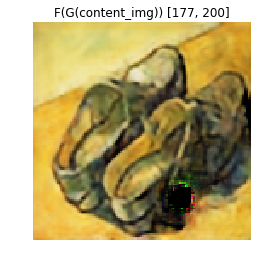

Advers_loss_Dy_Gx: 0.219 Advers_loss_Dx_Fy: 0.140 Cyc_loss: 0.145
[177, 250] G_loss: 1.807 Dx_loss: 0.195 Dy_loss: 0.340

Advers_loss_Dy_Gx: 0.236 Advers_loss_Dx_Fy: 0.157 Cyc_loss: 0.104
[177, 300] G_loss: 1.432 Dx_loss: 0.303 Dy_loss: 0.280



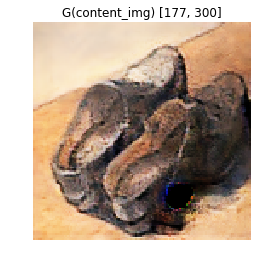

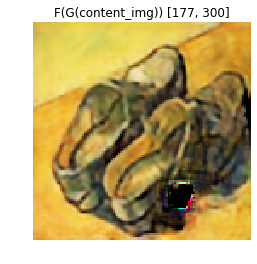

Advers_loss_Dy_Gx: 0.190 Advers_loss_Dx_Fy: 0.260 Cyc_loss: 0.115
[177, 350] G_loss: 1.600 Dx_loss: 0.207 Dy_loss: 0.395



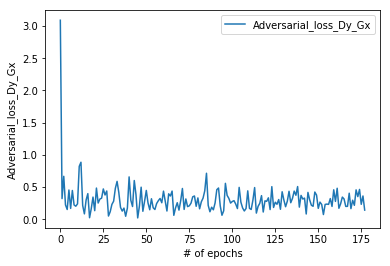

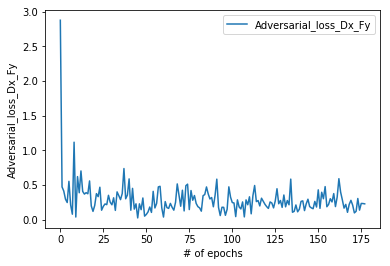

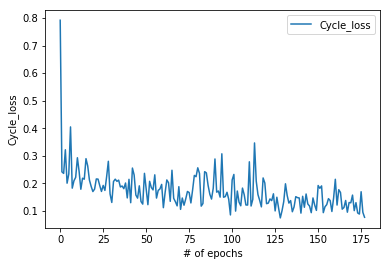

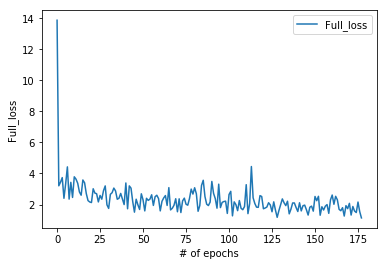

Advers_loss_Dy_Gx: 0.387 Advers_loss_Dx_Fy: 0.298 Cyc_loss: 0.212
[178, 0] G_loss: 2.802 Dx_loss: 0.218 Dy_loss: 0.235



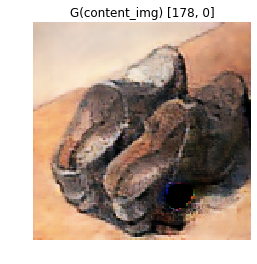

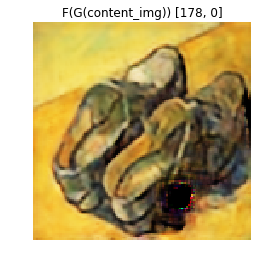

Advers_loss_Dy_Gx: 0.288 Advers_loss_Dx_Fy: 0.616 Cyc_loss: 0.138
[178, 50] G_loss: 2.285 Dx_loss: 0.140 Dy_loss: 0.128

Advers_loss_Dy_Gx: 0.323 Advers_loss_Dx_Fy: 0.765 Cyc_loss: 0.142
[178, 100] G_loss: 2.508 Dx_loss: 0.095 Dy_loss: 0.174



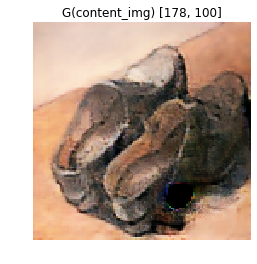

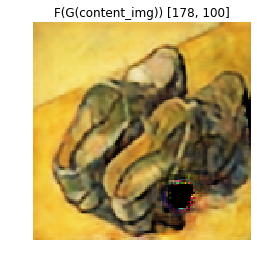

Advers_loss_Dy_Gx: 0.240 Advers_loss_Dx_Fy: 0.309 Cyc_loss: 0.156
[178, 150] G_loss: 2.107 Dx_loss: 0.172 Dy_loss: 0.220

Advers_loss_Dy_Gx: 0.205 Advers_loss_Dx_Fy: 0.105 Cyc_loss: 0.164
[178, 200] G_loss: 1.952 Dx_loss: 0.141 Dy_loss: 0.358



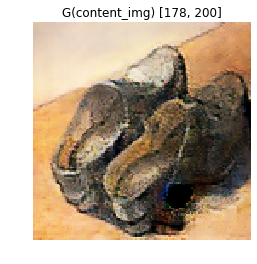

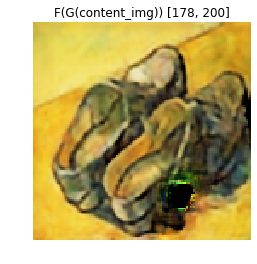

Advers_loss_Dy_Gx: 0.340 Advers_loss_Dx_Fy: 0.120 Cyc_loss: 0.116
[178, 250] G_loss: 1.615 Dx_loss: 0.330 Dy_loss: 0.300

Advers_loss_Dy_Gx: 0.151 Advers_loss_Dx_Fy: 0.142 Cyc_loss: 0.102
[178, 300] G_loss: 1.315 Dx_loss: 0.203 Dy_loss: 0.223



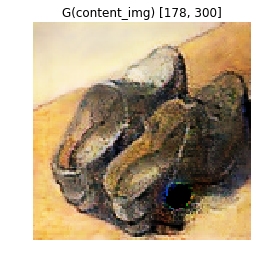

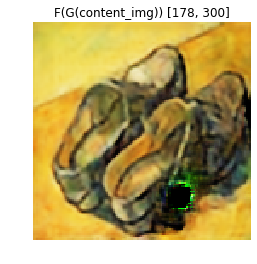

Advers_loss_Dy_Gx: 0.299 Advers_loss_Dx_Fy: 0.198 Cyc_loss: 0.132
[178, 350] G_loss: 1.818 Dx_loss: 0.280 Dy_loss: 0.272



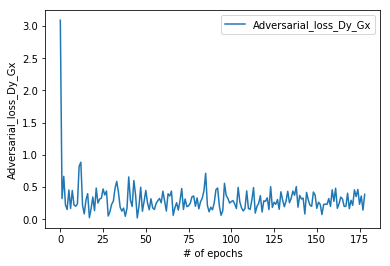

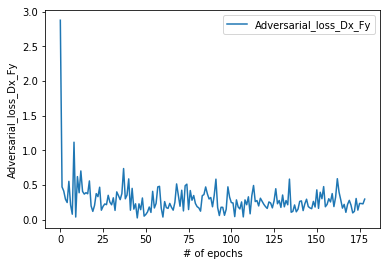

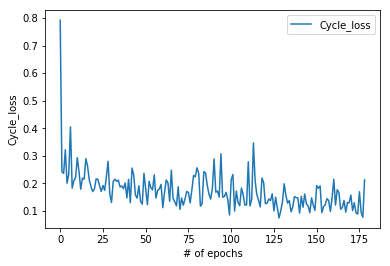

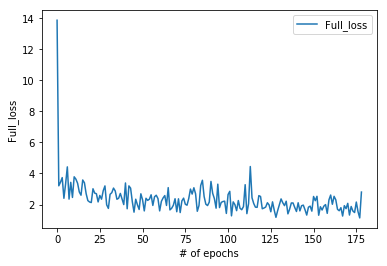

Advers_loss_Dy_Gx: 0.246 Advers_loss_Dx_Fy: 0.600 Cyc_loss: 0.111
[179, 0] G_loss: 1.952 Dx_loss: 0.110 Dy_loss: 0.111



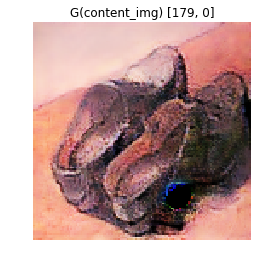

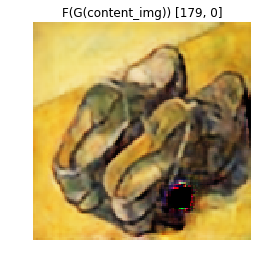

Advers_loss_Dy_Gx: 0.179 Advers_loss_Dx_Fy: 0.315 Cyc_loss: 0.136
[179, 50] G_loss: 1.851 Dx_loss: 0.210 Dy_loss: 0.185

Advers_loss_Dy_Gx: 0.223 Advers_loss_Dx_Fy: 0.257 Cyc_loss: 0.145
[179, 100] G_loss: 1.926 Dx_loss: 0.273 Dy_loss: 0.121



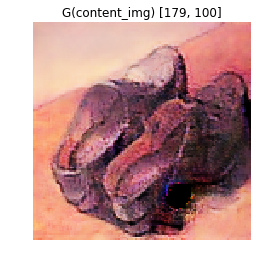

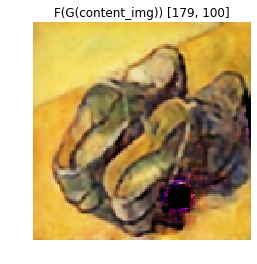

Advers_loss_Dy_Gx: 0.273 Advers_loss_Dx_Fy: 0.423 Cyc_loss: 0.194
[179, 150] G_loss: 2.636 Dx_loss: 0.293 Dy_loss: 0.097

Advers_loss_Dy_Gx: 0.146 Advers_loss_Dx_Fy: 0.189 Cyc_loss: 0.121
[179, 200] G_loss: 1.549 Dx_loss: 0.216 Dy_loss: 0.172



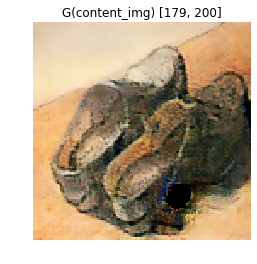

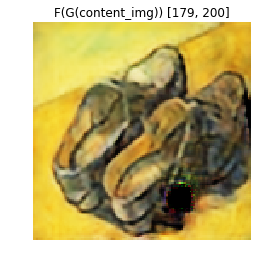

Advers_loss_Dy_Gx: 0.348 Advers_loss_Dx_Fy: 0.317 Cyc_loss: 0.116
[179, 250] G_loss: 1.824 Dx_loss: 0.254 Dy_loss: 0.216

Advers_loss_Dy_Gx: 0.410 Advers_loss_Dx_Fy: 0.161 Cyc_loss: 0.154
[179, 300] G_loss: 2.108 Dx_loss: 0.226 Dy_loss: 0.371



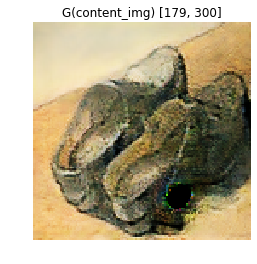

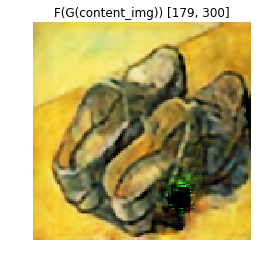

Advers_loss_Dy_Gx: 0.243 Advers_loss_Dx_Fy: 0.154 Cyc_loss: 0.089
[179, 350] G_loss: 1.282 Dx_loss: 0.233 Dy_loss: 0.341



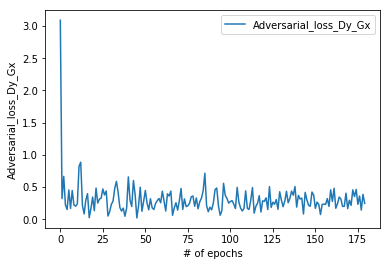

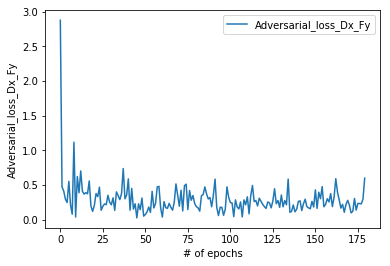

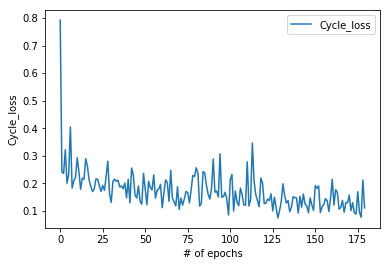

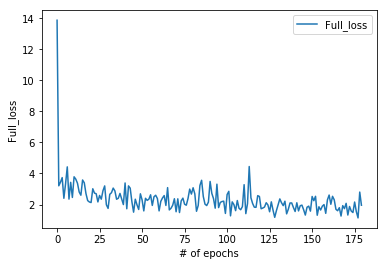

Advers_loss_Dy_Gx: 0.262 Advers_loss_Dx_Fy: 0.210 Cyc_loss: 0.121
[180, 0] G_loss: 1.678 Dx_loss: 0.250 Dy_loss: 0.201



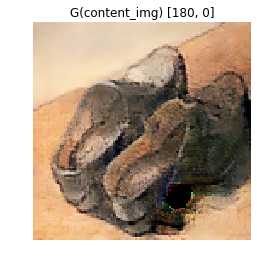

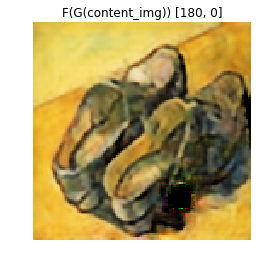

Advers_loss_Dy_Gx: 0.525 Advers_loss_Dx_Fy: 0.310 Cyc_loss: 0.091
[180, 50] G_loss: 1.745 Dx_loss: 0.123 Dy_loss: 0.321

Advers_loss_Dy_Gx: 0.207 Advers_loss_Dx_Fy: 0.221 Cyc_loss: 0.130
[180, 100] G_loss: 1.733 Dx_loss: 0.119 Dy_loss: 0.304



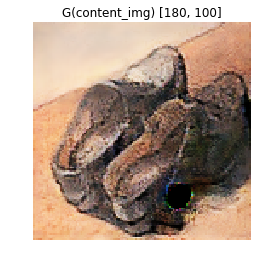

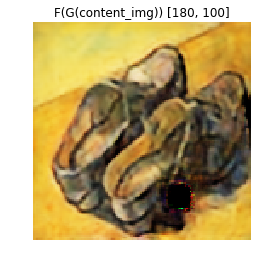

Advers_loss_Dy_Gx: 0.262 Advers_loss_Dx_Fy: 0.201 Cyc_loss: 0.213
[180, 150] G_loss: 2.591 Dx_loss: 0.116 Dy_loss: 0.242

Advers_loss_Dy_Gx: 0.151 Advers_loss_Dx_Fy: 0.936 Cyc_loss: 0.160
[180, 200] G_loss: 2.688 Dx_loss: 0.118 Dy_loss: 0.217



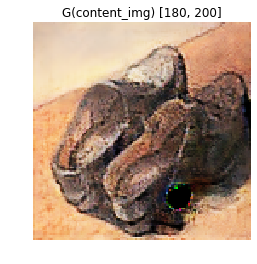

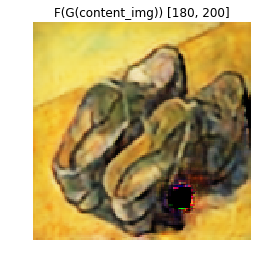

Advers_loss_Dy_Gx: 0.197 Advers_loss_Dx_Fy: 0.132 Cyc_loss: 0.114
[180, 250] G_loss: 1.465 Dx_loss: 0.255 Dy_loss: 0.168

Advers_loss_Dy_Gx: 0.278 Advers_loss_Dx_Fy: 0.284 Cyc_loss: 0.180
[180, 300] G_loss: 2.361 Dx_loss: 0.211 Dy_loss: 0.145



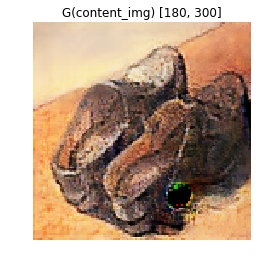

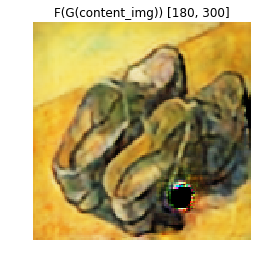

Advers_loss_Dy_Gx: 0.369 Advers_loss_Dx_Fy: 0.163 Cyc_loss: 0.123
[180, 350] G_loss: 1.762 Dx_loss: 0.220 Dy_loss: 0.159



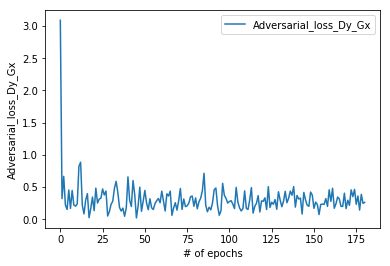

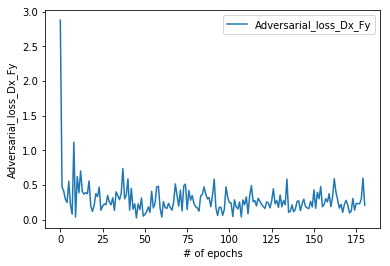

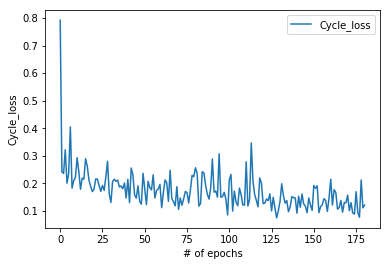

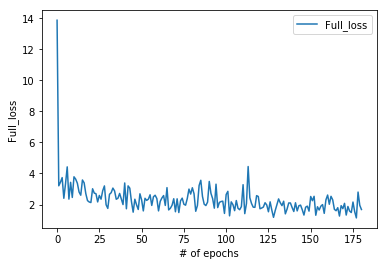

Advers_loss_Dy_Gx: 0.400 Advers_loss_Dx_Fy: 0.175 Cyc_loss: 0.129
[181, 0] G_loss: 1.862 Dx_loss: 0.224 Dy_loss: 0.133



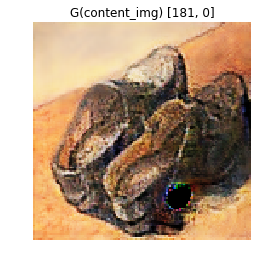

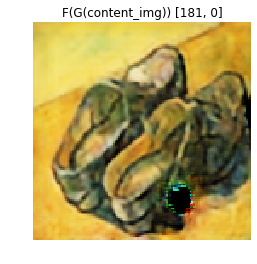

Advers_loss_Dy_Gx: 0.325 Advers_loss_Dx_Fy: 0.186 Cyc_loss: 0.149
[181, 50] G_loss: 2.002 Dx_loss: 0.214 Dy_loss: 0.135

Advers_loss_Dy_Gx: 0.386 Advers_loss_Dx_Fy: 0.400 Cyc_loss: 0.156
[181, 100] G_loss: 2.348 Dx_loss: 0.165 Dy_loss: 0.106



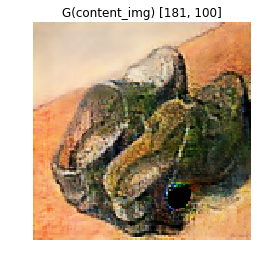

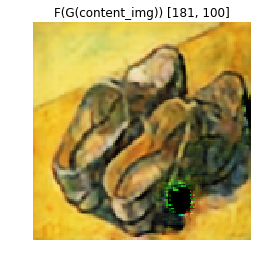

Advers_loss_Dy_Gx: 0.156 Advers_loss_Dx_Fy: 0.142 Cyc_loss: 0.171
[181, 150] G_loss: 2.003 Dx_loss: 0.271 Dy_loss: 0.224

Advers_loss_Dy_Gx: 0.294 Advers_loss_Dx_Fy: 0.213 Cyc_loss: 0.143
[181, 200] G_loss: 1.934 Dx_loss: 0.186 Dy_loss: 0.226



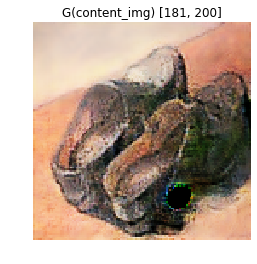

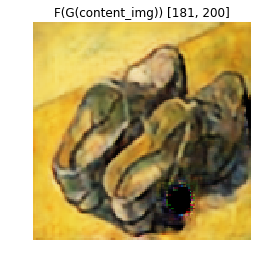

Advers_loss_Dy_Gx: 0.274 Advers_loss_Dx_Fy: 0.216 Cyc_loss: 0.144
[181, 250] G_loss: 1.929 Dx_loss: 0.225 Dy_loss: 0.240

Advers_loss_Dy_Gx: 0.222 Advers_loss_Dx_Fy: 0.270 Cyc_loss: 0.150
[181, 300] G_loss: 1.995 Dx_loss: 0.284 Dy_loss: 0.246



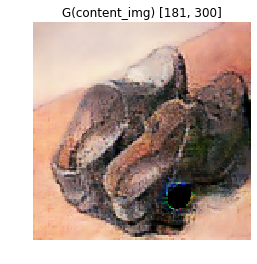

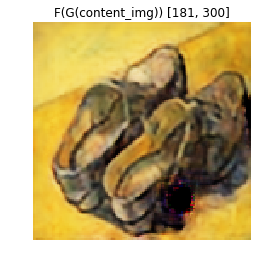

Advers_loss_Dy_Gx: 0.309 Advers_loss_Dx_Fy: 0.219 Cyc_loss: 0.142
[181, 350] G_loss: 1.951 Dx_loss: 0.149 Dy_loss: 0.225



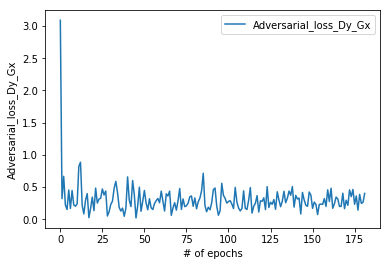

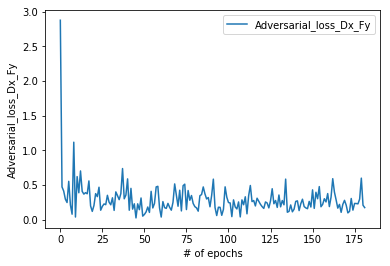

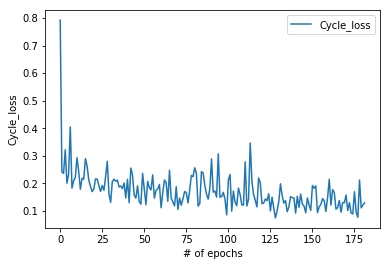

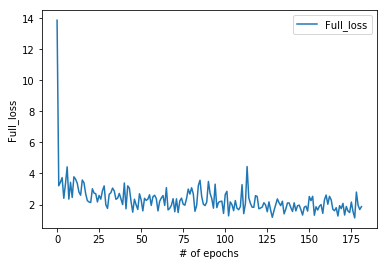

Advers_loss_Dy_Gx: 0.236 Advers_loss_Dx_Fy: 0.200 Cyc_loss: 0.121
[182, 0] G_loss: 1.647 Dx_loss: 0.162 Dy_loss: 0.198



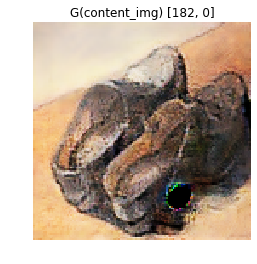

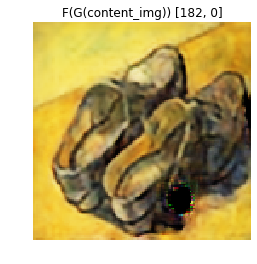

Advers_loss_Dy_Gx: 0.364 Advers_loss_Dx_Fy: 0.321 Cyc_loss: 0.126
[182, 50] G_loss: 1.942 Dx_loss: 0.137 Dy_loss: 0.210

Advers_loss_Dy_Gx: 0.239 Advers_loss_Dx_Fy: 0.144 Cyc_loss: 0.109
[182, 100] G_loss: 1.476 Dx_loss: 0.241 Dy_loss: 0.286



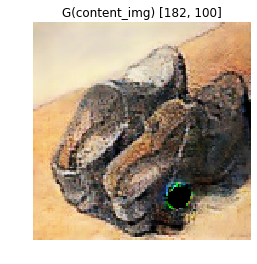

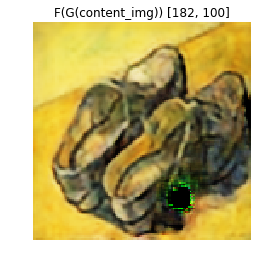

Advers_loss_Dy_Gx: 0.465 Advers_loss_Dx_Fy: 0.266 Cyc_loss: 0.150
[182, 150] G_loss: 2.230 Dx_loss: 0.163 Dy_loss: 0.217

Advers_loss_Dy_Gx: 0.346 Advers_loss_Dx_Fy: 0.155 Cyc_loss: 0.130
[182, 200] G_loss: 1.800 Dx_loss: 0.177 Dy_loss: 0.231



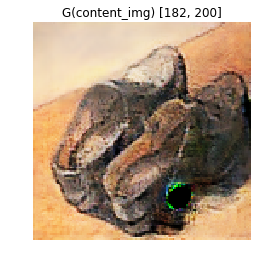

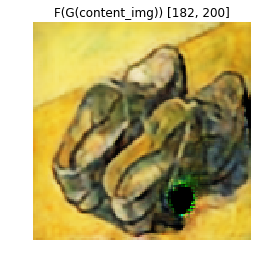

Advers_loss_Dy_Gx: 0.243 Advers_loss_Dx_Fy: 0.191 Cyc_loss: 0.085
[182, 250] G_loss: 1.280 Dx_loss: 0.256 Dy_loss: 0.168

Advers_loss_Dy_Gx: 0.421 Advers_loss_Dx_Fy: 0.219 Cyc_loss: 0.133
[182, 300] G_loss: 1.971 Dx_loss: 0.169 Dy_loss: 0.134



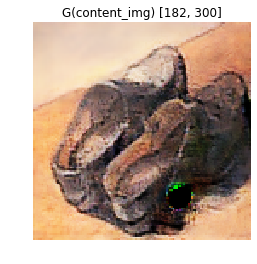

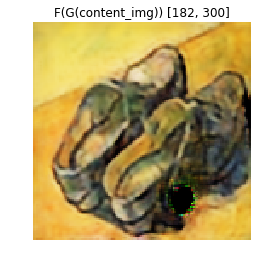

Advers_loss_Dy_Gx: 0.380 Advers_loss_Dx_Fy: 0.289 Cyc_loss: 0.090
[182, 350] G_loss: 1.573 Dx_loss: 0.206 Dy_loss: 0.282



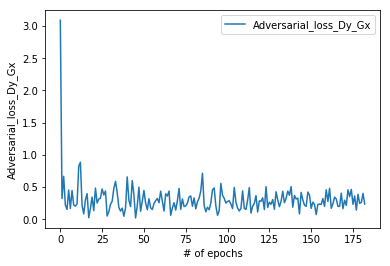

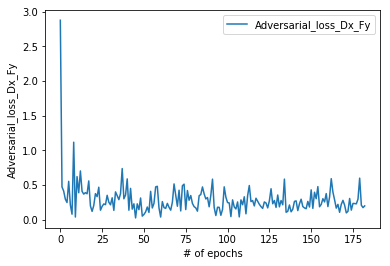

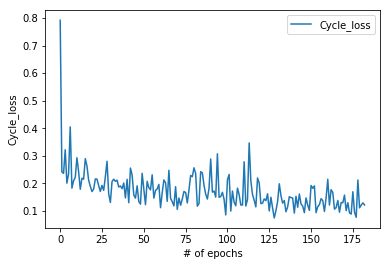

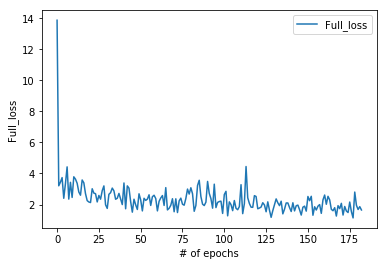

Advers_loss_Dy_Gx: 0.238 Advers_loss_Dx_Fy: 0.202 Cyc_loss: 0.128
[183, 0] G_loss: 1.716 Dx_loss: 0.259 Dy_loss: 0.162



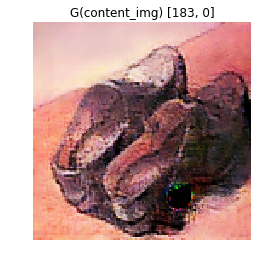

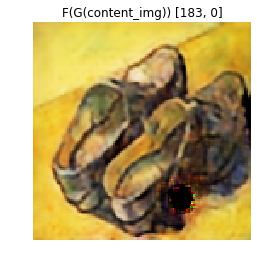

Advers_loss_Dy_Gx: 0.123 Advers_loss_Dx_Fy: 0.255 Cyc_loss: 0.107
[183, 50] G_loss: 1.446 Dx_loss: 0.312 Dy_loss: 0.127

Advers_loss_Dy_Gx: 0.323 Advers_loss_Dx_Fy: 0.144 Cyc_loss: 0.132
[183, 100] G_loss: 1.786 Dx_loss: 0.218 Dy_loss: 0.252



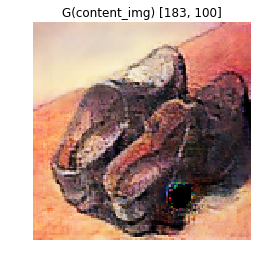

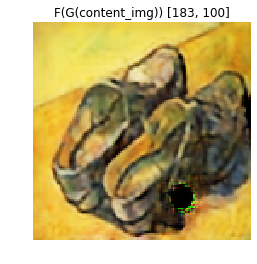

Advers_loss_Dy_Gx: 0.162 Advers_loss_Dx_Fy: 0.198 Cyc_loss: 0.095
[183, 150] G_loss: 1.314 Dx_loss: 0.234 Dy_loss: 0.247

Advers_loss_Dy_Gx: 0.121 Advers_loss_Dx_Fy: 0.337 Cyc_loss: 0.139
[183, 200] G_loss: 1.848 Dx_loss: 0.222 Dy_loss: 0.295



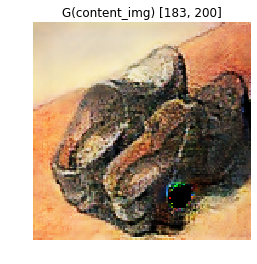

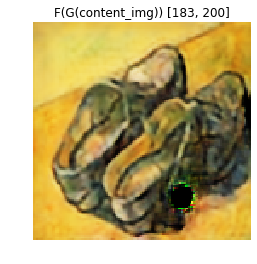

Advers_loss_Dy_Gx: 0.330 Advers_loss_Dx_Fy: 0.359 Cyc_loss: 0.105
[183, 250] G_loss: 1.743 Dx_loss: 0.227 Dy_loss: 0.156

Advers_loss_Dy_Gx: 0.194 Advers_loss_Dx_Fy: 0.209 Cyc_loss: 0.145
[183, 300] G_loss: 1.849 Dx_loss: 0.268 Dy_loss: 0.250



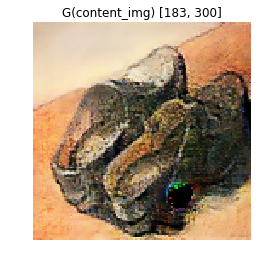

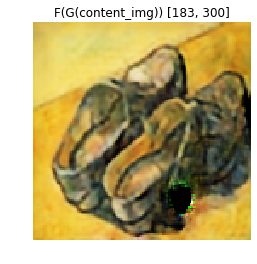

Advers_loss_Dy_Gx: 0.276 Advers_loss_Dx_Fy: 0.314 Cyc_loss: 0.126
[183, 350] G_loss: 1.847 Dx_loss: 0.184 Dy_loss: 0.438



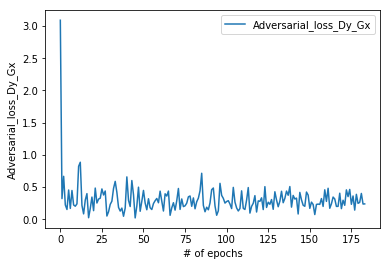

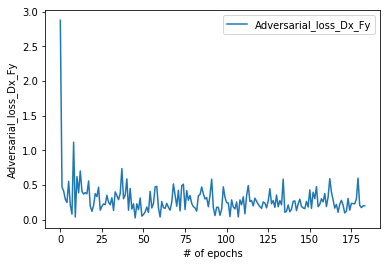

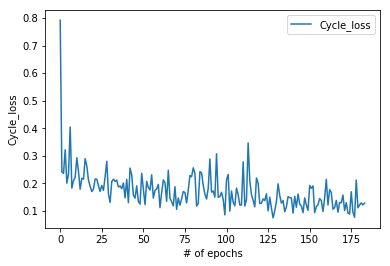

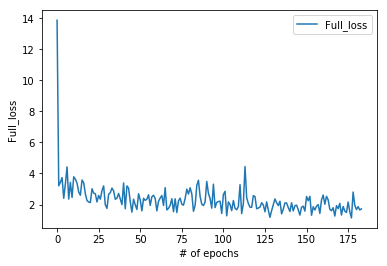

Advers_loss_Dy_Gx: 0.308 Advers_loss_Dx_Fy: 0.195 Cyc_loss: 0.141
[184, 0] G_loss: 1.916 Dx_loss: 0.259 Dy_loss: 0.269



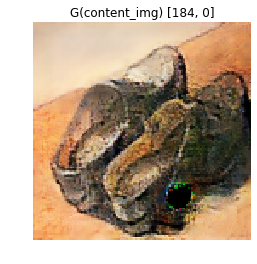

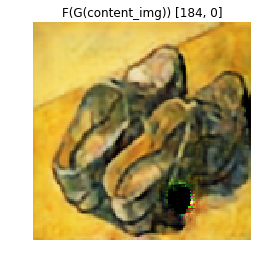

Advers_loss_Dy_Gx: 0.203 Advers_loss_Dx_Fy: 0.326 Cyc_loss: 0.109
[184, 50] G_loss: 1.618 Dx_loss: 0.392 Dy_loss: 0.176

Advers_loss_Dy_Gx: 0.340 Advers_loss_Dx_Fy: 0.304 Cyc_loss: 0.117
[184, 100] G_loss: 1.819 Dx_loss: 0.206 Dy_loss: 0.249



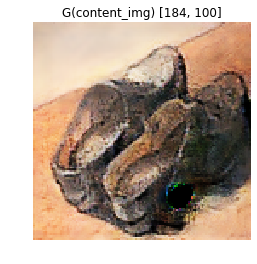

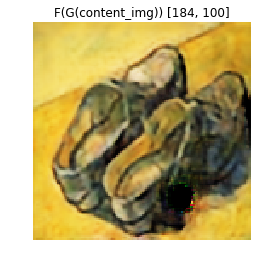

Advers_loss_Dy_Gx: 0.399 Advers_loss_Dx_Fy: 0.099 Cyc_loss: 0.095
[184, 150] G_loss: 1.449 Dx_loss: 0.154 Dy_loss: 0.258

Advers_loss_Dy_Gx: 0.205 Advers_loss_Dx_Fy: 0.065 Cyc_loss: 0.120
[184, 200] G_loss: 1.472 Dx_loss: 0.246 Dy_loss: 0.380



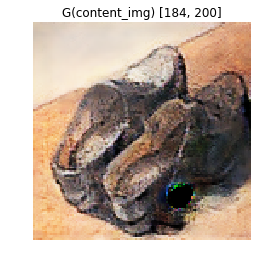

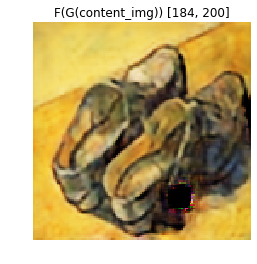

Advers_loss_Dy_Gx: 0.299 Advers_loss_Dx_Fy: 0.794 Cyc_loss: 0.111
[184, 250] G_loss: 2.205 Dx_loss: 0.165 Dy_loss: 0.208

Advers_loss_Dy_Gx: 0.318 Advers_loss_Dx_Fy: 0.319 Cyc_loss: 0.103
[184, 300] G_loss: 1.665 Dx_loss: 0.276 Dy_loss: 0.298



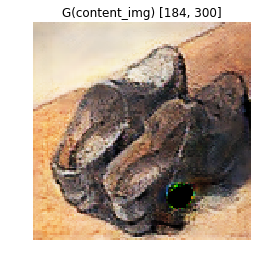

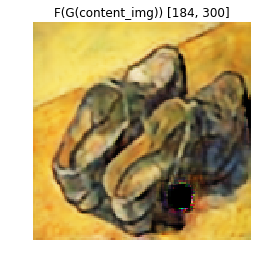

Advers_loss_Dy_Gx: 0.185 Advers_loss_Dx_Fy: 0.258 Cyc_loss: 0.126
[184, 350] G_loss: 1.703 Dx_loss: 0.226 Dy_loss: 0.184



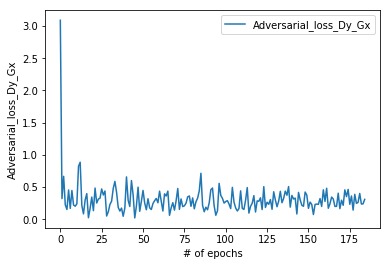

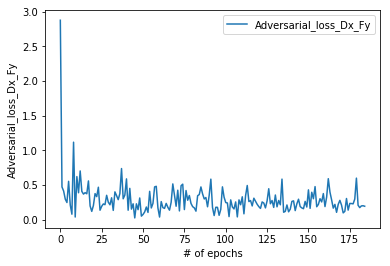

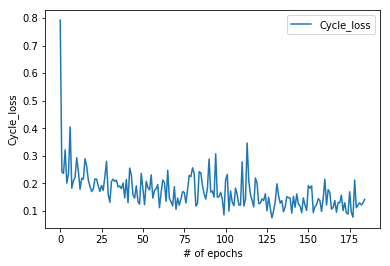

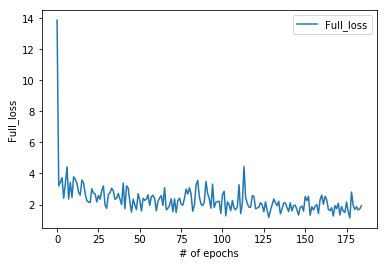

Advers_loss_Dy_Gx: 0.274 Advers_loss_Dx_Fy: 0.385 Cyc_loss: 0.127
[185, 0] G_loss: 1.925 Dx_loss: 0.204 Dy_loss: 0.222



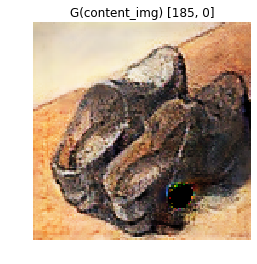

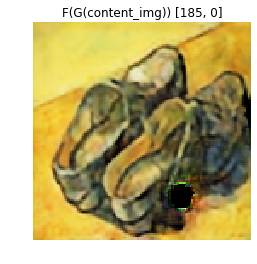

Advers_loss_Dy_Gx: 0.291 Advers_loss_Dx_Fy: 0.308 Cyc_loss: 0.101
[185, 50] G_loss: 1.609 Dx_loss: 0.198 Dy_loss: 0.149

Advers_loss_Dy_Gx: 0.112 Advers_loss_Dx_Fy: 0.372 Cyc_loss: 0.117
[185, 100] G_loss: 1.656 Dx_loss: 0.221 Dy_loss: 0.157



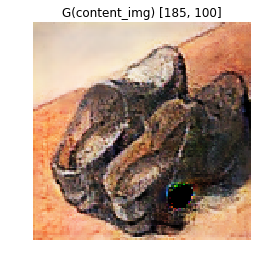

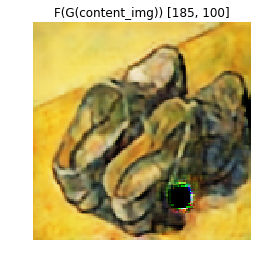

Advers_loss_Dy_Gx: 0.261 Advers_loss_Dx_Fy: 0.135 Cyc_loss: 0.095
[185, 150] G_loss: 1.345 Dx_loss: 0.313 Dy_loss: 0.188

Advers_loss_Dy_Gx: 0.445 Advers_loss_Dx_Fy: 0.166 Cyc_loss: 0.141
[185, 200] G_loss: 2.017 Dx_loss: 0.203 Dy_loss: 0.315



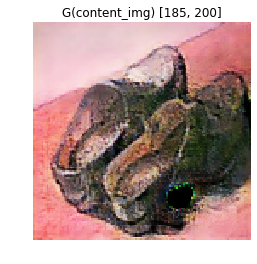

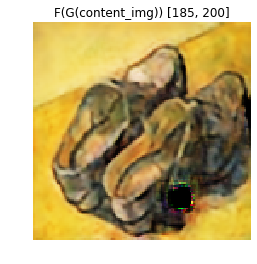

Advers_loss_Dy_Gx: 0.286 Advers_loss_Dx_Fy: 0.242 Cyc_loss: 0.113
[185, 250] G_loss: 1.654 Dx_loss: 0.236 Dy_loss: 0.199

Advers_loss_Dy_Gx: 0.309 Advers_loss_Dx_Fy: 0.254 Cyc_loss: 0.115
[185, 300] G_loss: 1.718 Dx_loss: 0.219 Dy_loss: 0.257



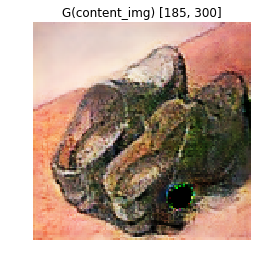

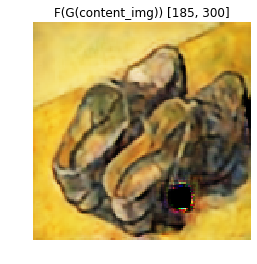

Advers_loss_Dy_Gx: 0.273 Advers_loss_Dx_Fy: 0.253 Cyc_loss: 0.121
[185, 350] G_loss: 1.734 Dx_loss: 0.193 Dy_loss: 0.157



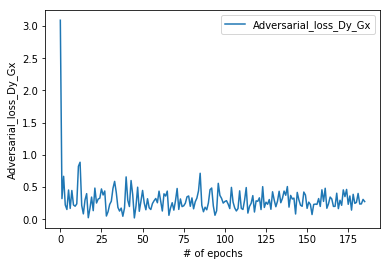

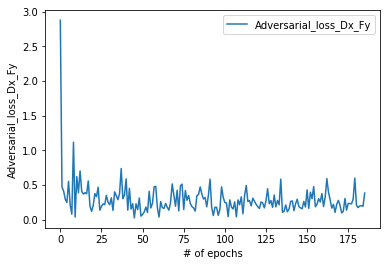

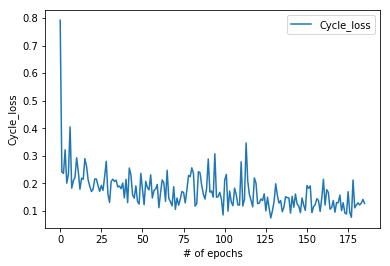

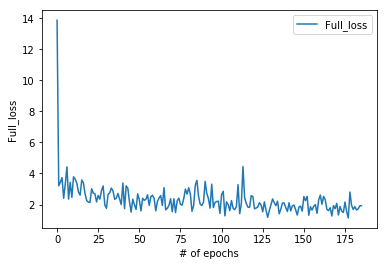

Advers_loss_Dy_Gx: 0.277 Advers_loss_Dx_Fy: 0.287 Cyc_loss: 0.124
[186, 0] G_loss: 1.807 Dx_loss: 0.133 Dy_loss: 0.314



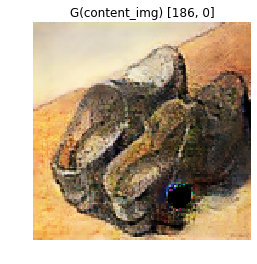

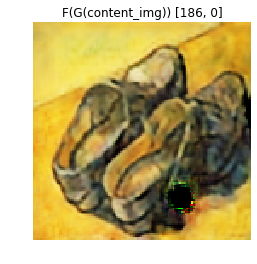

Advers_loss_Dy_Gx: 0.388 Advers_loss_Dx_Fy: 0.506 Cyc_loss: 0.112
[186, 50] G_loss: 2.015 Dx_loss: 0.158 Dy_loss: 0.099

Advers_loss_Dy_Gx: 0.431 Advers_loss_Dx_Fy: 0.267 Cyc_loss: 0.121
[186, 100] G_loss: 1.909 Dx_loss: 0.182 Dy_loss: 0.363



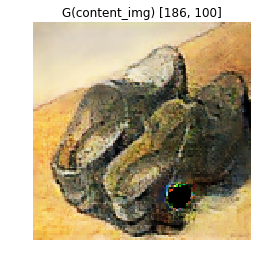

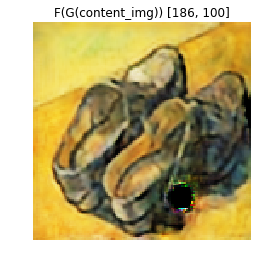

Advers_loss_Dy_Gx: 0.371 Advers_loss_Dx_Fy: 0.304 Cyc_loss: 0.092
[186, 150] G_loss: 1.598 Dx_loss: 0.237 Dy_loss: 0.353

Advers_loss_Dy_Gx: 0.232 Advers_loss_Dx_Fy: 0.189 Cyc_loss: 0.150
[186, 200] G_loss: 1.918 Dx_loss: 0.242 Dy_loss: 0.235



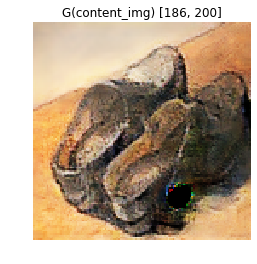

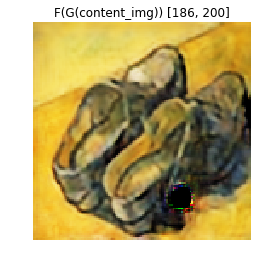

Advers_loss_Dy_Gx: 0.154 Advers_loss_Dx_Fy: 0.217 Cyc_loss: 0.145
[186, 250] G_loss: 1.823 Dx_loss: 0.264 Dy_loss: 0.307

Advers_loss_Dy_Gx: 0.382 Advers_loss_Dx_Fy: 0.346 Cyc_loss: 0.118
[186, 300] G_loss: 1.906 Dx_loss: 0.126 Dy_loss: 0.198



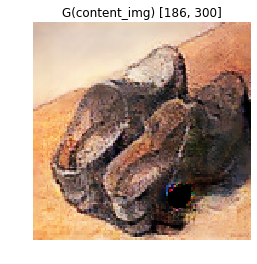

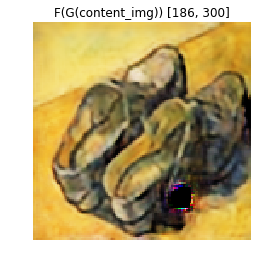

Advers_loss_Dy_Gx: 0.296 Advers_loss_Dx_Fy: 0.219 Cyc_loss: 0.135
[186, 350] G_loss: 1.869 Dx_loss: 0.260 Dy_loss: 0.241



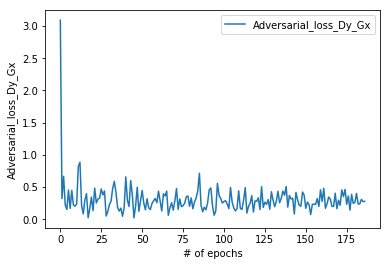

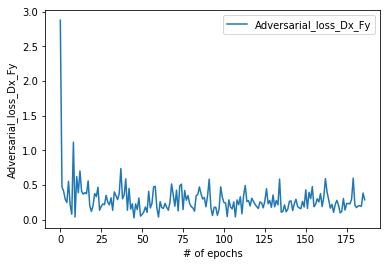

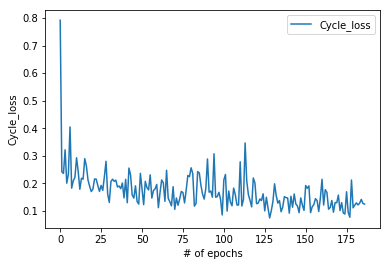

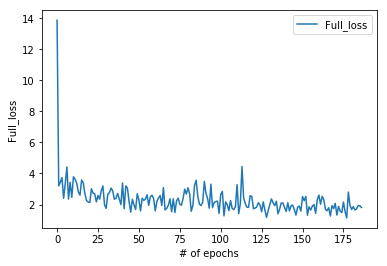

Advers_loss_Dy_Gx: 0.442 Advers_loss_Dx_Fy: 0.167 Cyc_loss: 0.099
[187, 0] G_loss: 1.599 Dx_loss: 0.281 Dy_loss: 0.259



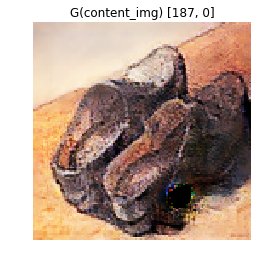

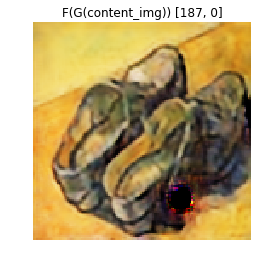

Advers_loss_Dy_Gx: 0.102 Advers_loss_Dx_Fy: 0.148 Cyc_loss: 0.084
[187, 50] G_loss: 1.092 Dx_loss: 0.270 Dy_loss: 0.370

Advers_loss_Dy_Gx: 0.237 Advers_loss_Dx_Fy: 0.354 Cyc_loss: 0.106
[187, 100] G_loss: 1.653 Dx_loss: 0.257 Dy_loss: 0.196



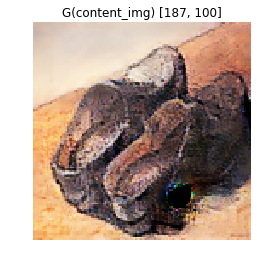

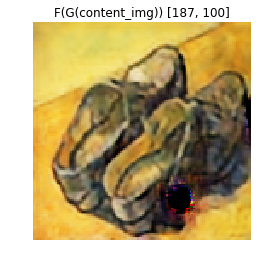

Advers_loss_Dy_Gx: 0.343 Advers_loss_Dx_Fy: 0.251 Cyc_loss: 0.130
[187, 150] G_loss: 1.898 Dx_loss: 0.169 Dy_loss: 0.137

Advers_loss_Dy_Gx: 0.294 Advers_loss_Dx_Fy: 0.227 Cyc_loss: 0.088
[187, 200] G_loss: 1.396 Dx_loss: 0.241 Dy_loss: 0.232



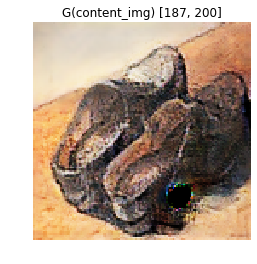

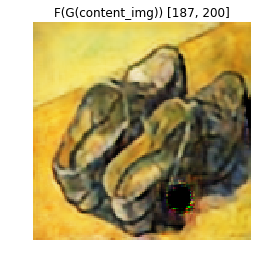

Advers_loss_Dy_Gx: 0.425 Advers_loss_Dx_Fy: 0.136 Cyc_loss: 0.166
[187, 250] G_loss: 2.224 Dx_loss: 0.266 Dy_loss: 0.213

Advers_loss_Dy_Gx: 0.214 Advers_loss_Dx_Fy: 0.399 Cyc_loss: 0.126
[187, 300] G_loss: 1.869 Dx_loss: 0.145 Dy_loss: 0.088



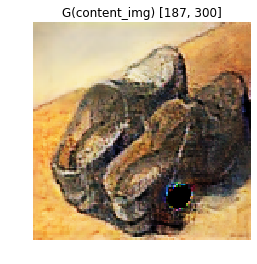

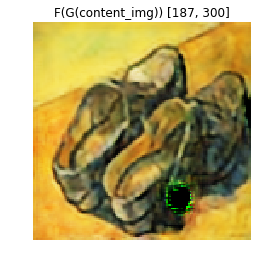

Advers_loss_Dy_Gx: 0.272 Advers_loss_Dx_Fy: 0.192 Cyc_loss: 0.218
[187, 350] G_loss: 2.644 Dx_loss: 0.305 Dy_loss: 0.159



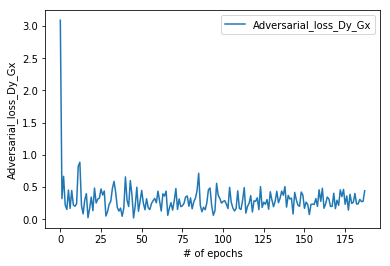

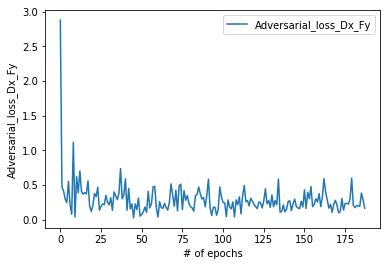

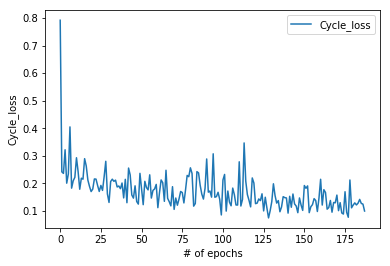

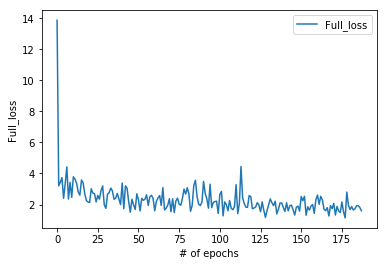

Advers_loss_Dy_Gx: 0.390 Advers_loss_Dx_Fy: 0.130 Cyc_loss: 0.111
[188, 0] G_loss: 1.628 Dx_loss: 0.152 Dy_loss: 0.244



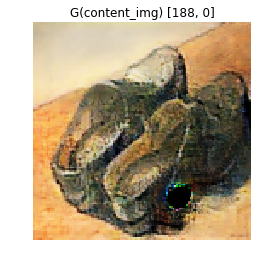

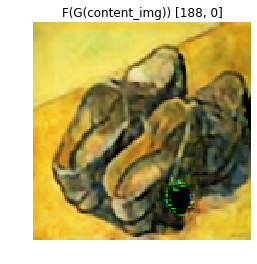

Advers_loss_Dy_Gx: 0.252 Advers_loss_Dx_Fy: 0.177 Cyc_loss: 0.109
[188, 50] G_loss: 1.515 Dx_loss: 0.271 Dy_loss: 0.213

Advers_loss_Dy_Gx: 0.217 Advers_loss_Dx_Fy: 0.294 Cyc_loss: 0.128
[188, 100] G_loss: 1.796 Dx_loss: 0.209 Dy_loss: 0.132



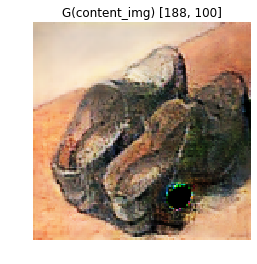

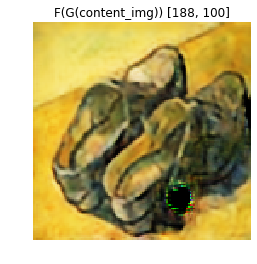

Advers_loss_Dy_Gx: 0.318 Advers_loss_Dx_Fy: 0.145 Cyc_loss: 0.104
[188, 150] G_loss: 1.504 Dx_loss: 0.255 Dy_loss: 0.169

Advers_loss_Dy_Gx: 0.304 Advers_loss_Dx_Fy: 0.166 Cyc_loss: 0.135
[188, 200] G_loss: 1.823 Dx_loss: 0.212 Dy_loss: 0.171



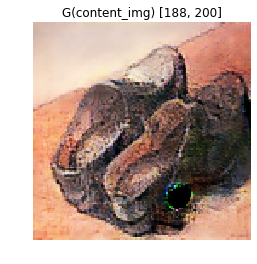

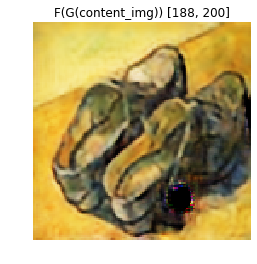

Advers_loss_Dy_Gx: 0.296 Advers_loss_Dx_Fy: 0.257 Cyc_loss: 0.113
[188, 250] G_loss: 1.686 Dx_loss: 0.262 Dy_loss: 0.198

Advers_loss_Dy_Gx: 0.223 Advers_loss_Dx_Fy: 0.298 Cyc_loss: 0.106
[188, 300] G_loss: 1.577 Dx_loss: 0.172 Dy_loss: 0.289



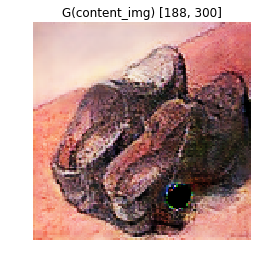

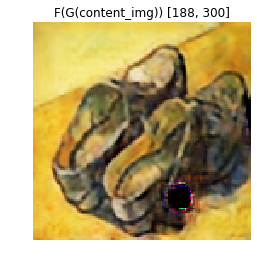

Advers_loss_Dy_Gx: 0.820 Advers_loss_Dx_Fy: 0.268 Cyc_loss: 0.155
[188, 350] G_loss: 2.638 Dx_loss: 0.173 Dy_loss: 0.186



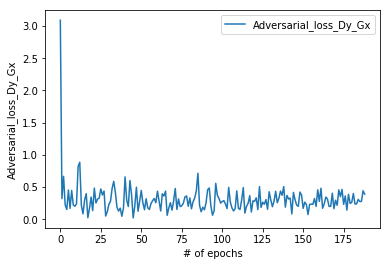

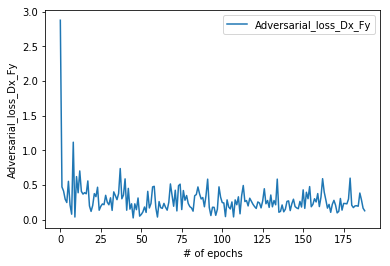

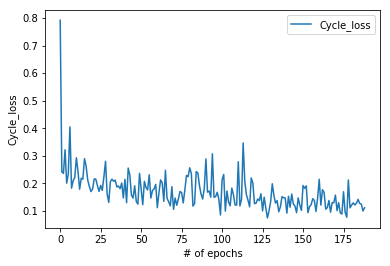

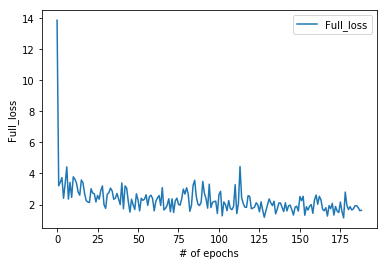

Advers_loss_Dy_Gx: 0.270 Advers_loss_Dx_Fy: 0.266 Cyc_loss: 0.150
[189, 0] G_loss: 2.033 Dx_loss: 0.128 Dy_loss: 0.230



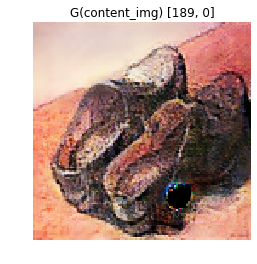

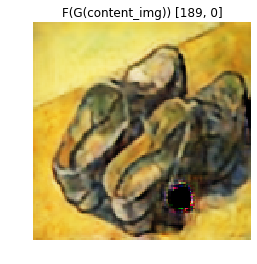

Advers_loss_Dy_Gx: 0.229 Advers_loss_Dx_Fy: 0.201 Cyc_loss: 0.144
[189, 50] G_loss: 1.871 Dx_loss: 0.206 Dy_loss: 0.217

Advers_loss_Dy_Gx: 0.235 Advers_loss_Dx_Fy: 0.265 Cyc_loss: 0.194
[189, 100] G_loss: 2.445 Dx_loss: 0.231 Dy_loss: 0.356



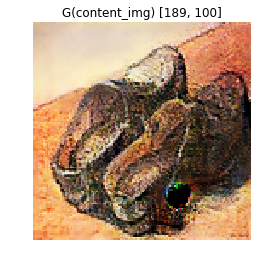

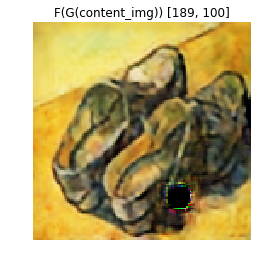

Advers_loss_Dy_Gx: 0.419 Advers_loss_Dx_Fy: 0.205 Cyc_loss: 0.133
[189, 150] G_loss: 1.956 Dx_loss: 0.235 Dy_loss: 0.190

Advers_loss_Dy_Gx: 0.618 Advers_loss_Dx_Fy: 0.379 Cyc_loss: 0.161
[189, 200] G_loss: 2.605 Dx_loss: 0.134 Dy_loss: 0.107



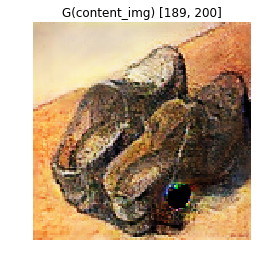

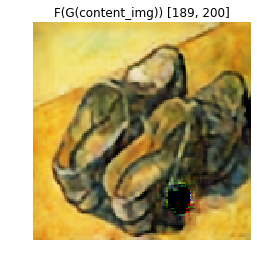

Advers_loss_Dy_Gx: 0.315 Advers_loss_Dx_Fy: 0.298 Cyc_loss: 0.101
[189, 250] G_loss: 1.627 Dx_loss: 0.300 Dy_loss: 0.192

Advers_loss_Dy_Gx: 0.173 Advers_loss_Dx_Fy: 0.085 Cyc_loss: 0.178
[189, 300] G_loss: 2.040 Dx_loss: 0.285 Dy_loss: 0.244



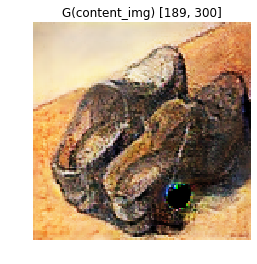

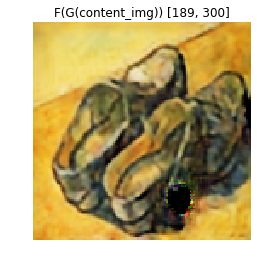

Advers_loss_Dy_Gx: 0.324 Advers_loss_Dx_Fy: 0.145 Cyc_loss: 0.134
[189, 350] G_loss: 1.814 Dx_loss: 0.311 Dy_loss: 0.235



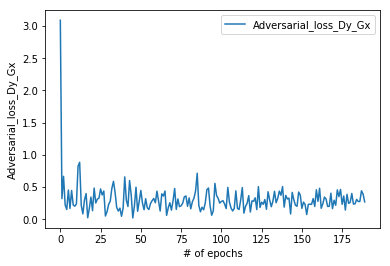

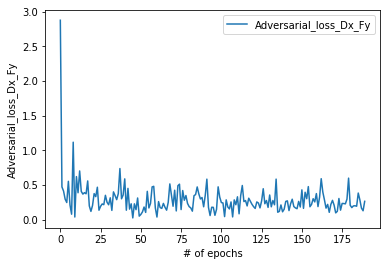

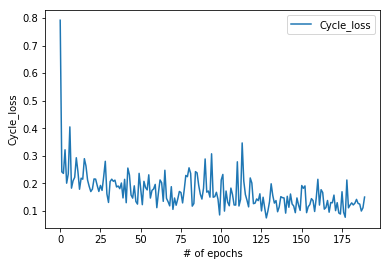

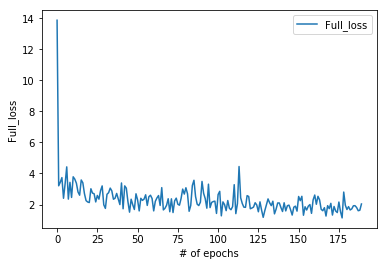

Advers_loss_Dy_Gx: 0.263 Advers_loss_Dx_Fy: 0.462 Cyc_loss: 0.104
[190, 0] G_loss: 1.760 Dx_loss: 0.207 Dy_loss: 0.244



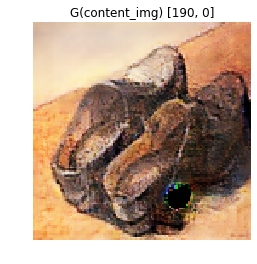

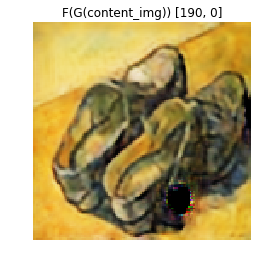

Advers_loss_Dy_Gx: 0.250 Advers_loss_Dx_Fy: 1.020 Cyc_loss: 0.171
[190, 50] G_loss: 2.979 Dx_loss: 0.277 Dy_loss: 0.112

Advers_loss_Dy_Gx: 0.282 Advers_loss_Dx_Fy: 0.472 Cyc_loss: 0.139
[190, 100] G_loss: 2.143 Dx_loss: 0.347 Dy_loss: 0.242



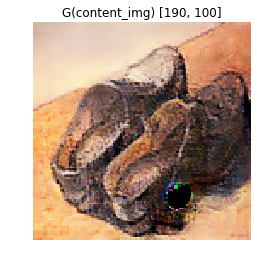

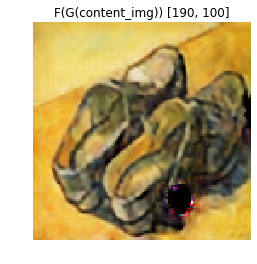

Advers_loss_Dy_Gx: 0.246 Advers_loss_Dx_Fy: 0.199 Cyc_loss: 0.138
[190, 150] G_loss: 1.825 Dx_loss: 0.311 Dy_loss: 0.345

Advers_loss_Dy_Gx: 0.315 Advers_loss_Dx_Fy: 0.236 Cyc_loss: 0.198
[190, 200] G_loss: 2.528 Dx_loss: 0.214 Dy_loss: 0.234



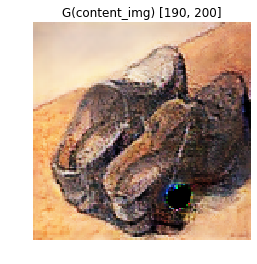

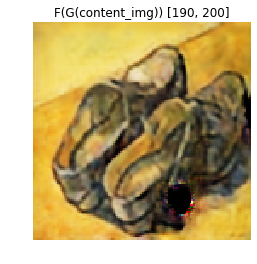

Advers_loss_Dy_Gx: 0.198 Advers_loss_Dx_Fy: 0.463 Cyc_loss: 0.116
[190, 250] G_loss: 1.823 Dx_loss: 0.335 Dy_loss: 0.240

Advers_loss_Dy_Gx: 0.346 Advers_loss_Dx_Fy: 0.336 Cyc_loss: 0.153
[190, 300] G_loss: 2.214 Dx_loss: 0.298 Dy_loss: 0.152



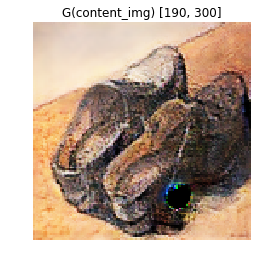

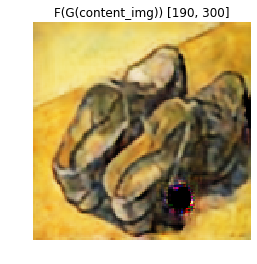

Advers_loss_Dy_Gx: 0.296 Advers_loss_Dx_Fy: 0.163 Cyc_loss: 0.107
[190, 350] G_loss: 1.525 Dx_loss: 0.330 Dy_loss: 0.186



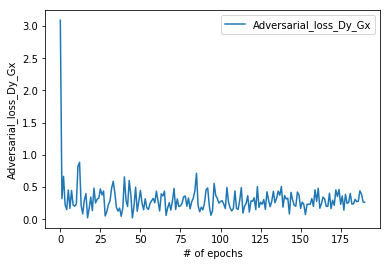

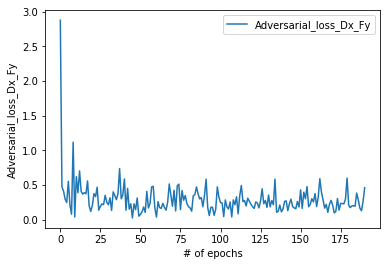

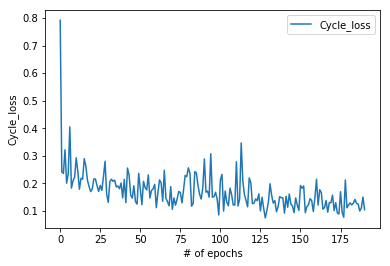

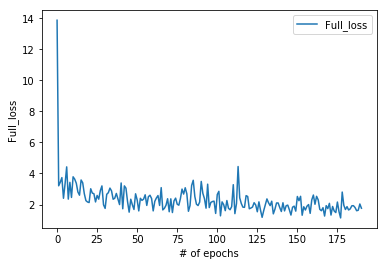

Advers_loss_Dy_Gx: 0.304 Advers_loss_Dx_Fy: 0.272 Cyc_loss: 0.118
[191, 0] G_loss: 1.755 Dx_loss: 0.203 Dy_loss: 0.191



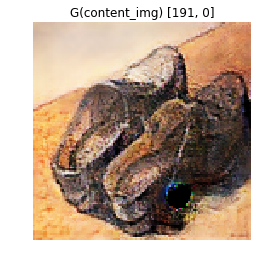

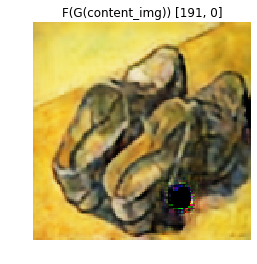

Advers_loss_Dy_Gx: 0.248 Advers_loss_Dx_Fy: 0.213 Cyc_loss: 0.095
[191, 50] G_loss: 1.414 Dx_loss: 0.170 Dy_loss: 0.289

Advers_loss_Dy_Gx: 0.241 Advers_loss_Dx_Fy: 0.204 Cyc_loss: 0.125
[191, 100] G_loss: 1.693 Dx_loss: 0.260 Dy_loss: 0.287



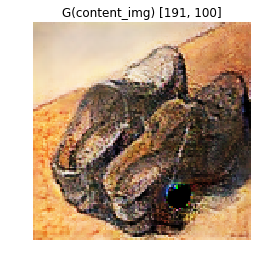

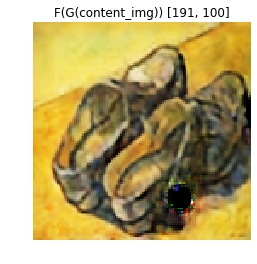

Advers_loss_Dy_Gx: 0.224 Advers_loss_Dx_Fy: 0.450 Cyc_loss: 0.114
[191, 150] G_loss: 1.813 Dx_loss: 0.129 Dy_loss: 0.171

Advers_loss_Dy_Gx: 0.171 Advers_loss_Dx_Fy: 0.432 Cyc_loss: 0.132
[191, 200] G_loss: 1.922 Dx_loss: 0.116 Dy_loss: 0.165



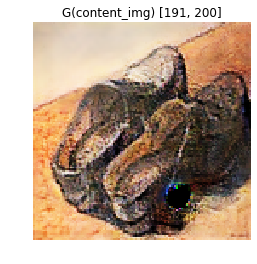

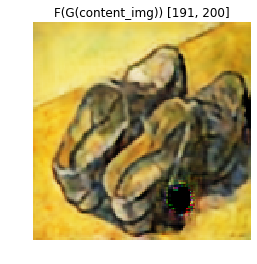

Advers_loss_Dy_Gx: 0.293 Advers_loss_Dx_Fy: 0.250 Cyc_loss: 0.134
[191, 250] G_loss: 1.887 Dx_loss: 0.218 Dy_loss: 0.284

Advers_loss_Dy_Gx: 0.163 Advers_loss_Dx_Fy: 0.232 Cyc_loss: 0.108
[191, 300] G_loss: 1.475 Dx_loss: 0.137 Dy_loss: 0.314



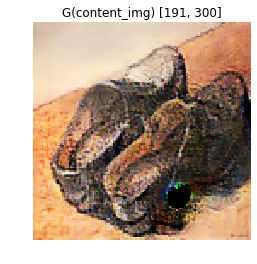

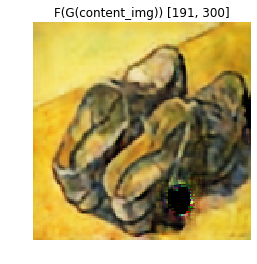

Advers_loss_Dy_Gx: 0.326 Advers_loss_Dx_Fy: 0.304 Cyc_loss: 0.128
[191, 350] G_loss: 1.908 Dx_loss: 0.116 Dy_loss: 0.206



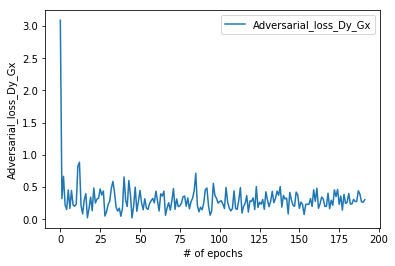

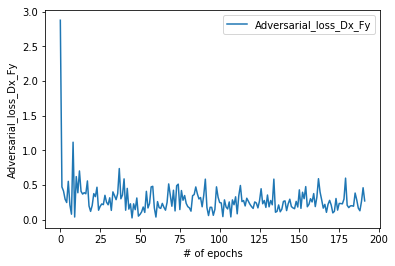

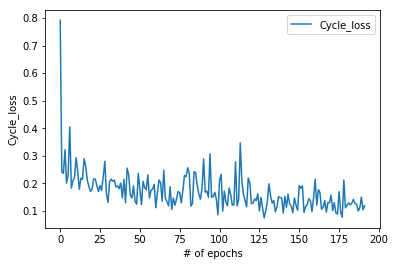

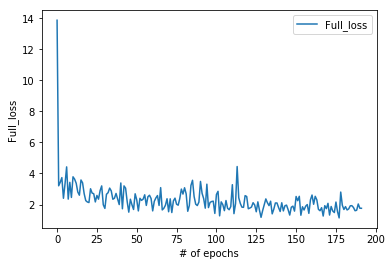

Advers_loss_Dy_Gx: 0.414 Advers_loss_Dx_Fy: 0.210 Cyc_loss: 0.116
[192, 0] G_loss: 1.788 Dx_loss: 0.163 Dy_loss: 0.181



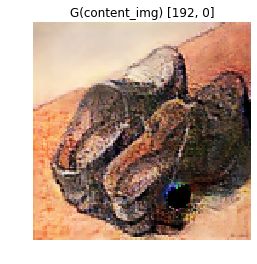

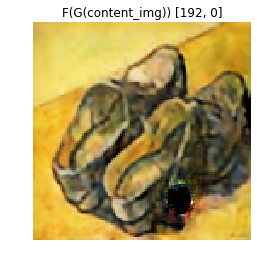

Advers_loss_Dy_Gx: 0.478 Advers_loss_Dx_Fy: 0.265 Cyc_loss: 0.122
[192, 50] G_loss: 1.962 Dx_loss: 0.207 Dy_loss: 0.211

Advers_loss_Dy_Gx: 0.149 Advers_loss_Dx_Fy: 0.263 Cyc_loss: 0.157
[192, 100] G_loss: 1.984 Dx_loss: 0.227 Dy_loss: 0.256



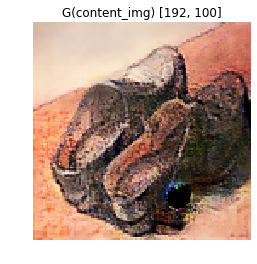

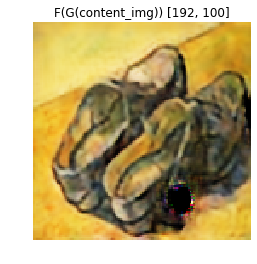

Advers_loss_Dy_Gx: 0.203 Advers_loss_Dx_Fy: 0.223 Cyc_loss: 0.102
[192, 150] G_loss: 1.444 Dx_loss: 0.266 Dy_loss: 0.302

Advers_loss_Dy_Gx: 0.189 Advers_loss_Dx_Fy: 0.122 Cyc_loss: 0.146
[192, 200] G_loss: 1.768 Dx_loss: 0.280 Dy_loss: 0.286



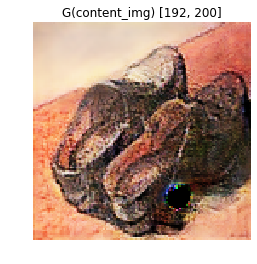

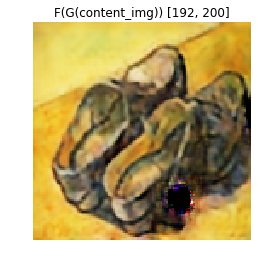

Advers_loss_Dy_Gx: 0.323 Advers_loss_Dx_Fy: 0.148 Cyc_loss: 0.111
[192, 250] G_loss: 1.585 Dx_loss: 0.161 Dy_loss: 0.205

Advers_loss_Dy_Gx: 0.199 Advers_loss_Dx_Fy: 0.212 Cyc_loss: 0.087
[192, 300] G_loss: 1.276 Dx_loss: 0.219 Dy_loss: 0.223



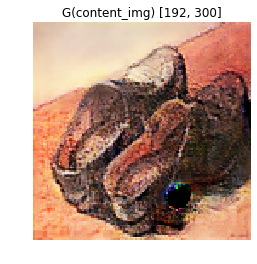

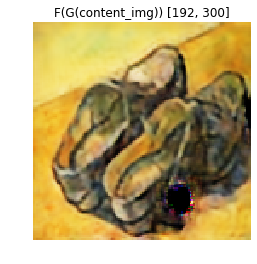

Advers_loss_Dy_Gx: 0.204 Advers_loss_Dx_Fy: 0.246 Cyc_loss: 0.116
[192, 350] G_loss: 1.609 Dx_loss: 0.196 Dy_loss: 0.239



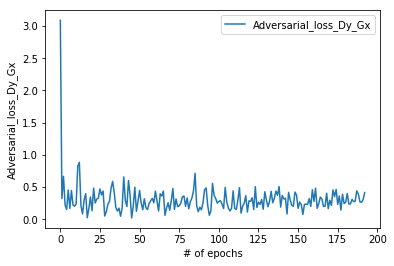

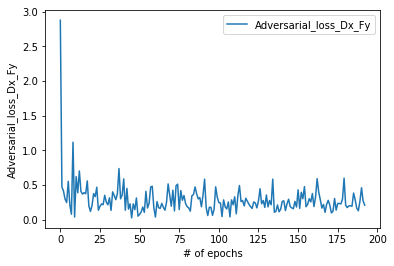

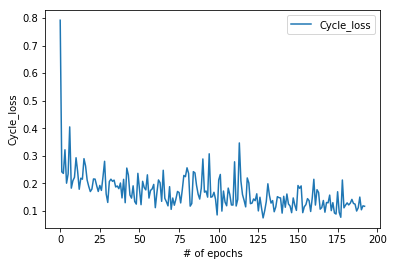

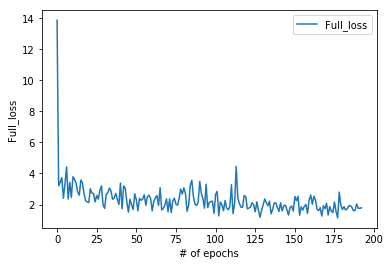

Advers_loss_Dy_Gx: 0.393 Advers_loss_Dx_Fy: 0.271 Cyc_loss: 0.127
[193, 0] G_loss: 1.933 Dx_loss: 0.193 Dy_loss: 0.117



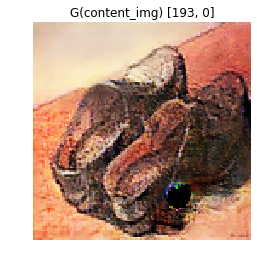

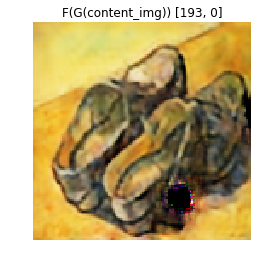

Advers_loss_Dy_Gx: 0.172 Advers_loss_Dx_Fy: 0.286 Cyc_loss: 0.104
[193, 50] G_loss: 1.496 Dx_loss: 0.254 Dy_loss: 0.187

Advers_loss_Dy_Gx: 0.308 Advers_loss_Dx_Fy: 0.153 Cyc_loss: 0.092
[193, 100] G_loss: 1.381 Dx_loss: 0.217 Dy_loss: 0.267



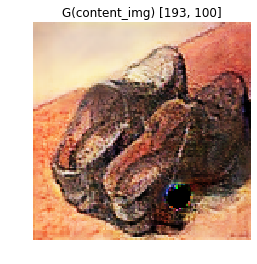

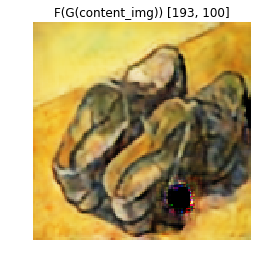

Advers_loss_Dy_Gx: 0.203 Advers_loss_Dx_Fy: 0.158 Cyc_loss: 0.153
[193, 150] G_loss: 1.890 Dx_loss: 0.246 Dy_loss: 0.168

Advers_loss_Dy_Gx: 0.239 Advers_loss_Dx_Fy: 0.178 Cyc_loss: 0.113
[193, 200] G_loss: 1.544 Dx_loss: 0.183 Dy_loss: 0.257



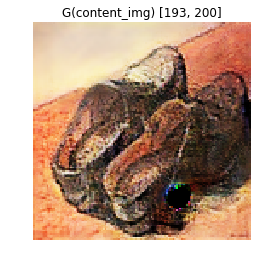

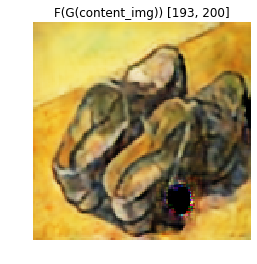

Advers_loss_Dy_Gx: 0.206 Advers_loss_Dx_Fy: 0.215 Cyc_loss: 0.136
[193, 250] G_loss: 1.784 Dx_loss: 0.259 Dy_loss: 0.261

Advers_loss_Dy_Gx: 0.206 Advers_loss_Dx_Fy: 0.331 Cyc_loss: 0.114
[193, 300] G_loss: 1.679 Dx_loss: 0.218 Dy_loss: 0.205



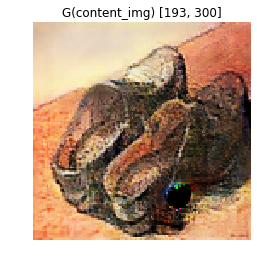

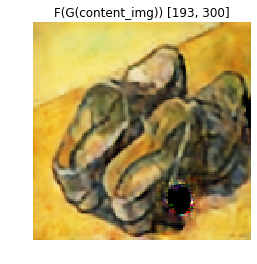

Advers_loss_Dy_Gx: 0.229 Advers_loss_Dx_Fy: 0.296 Cyc_loss: 0.118
[193, 350] G_loss: 1.709 Dx_loss: 0.225 Dy_loss: 0.196



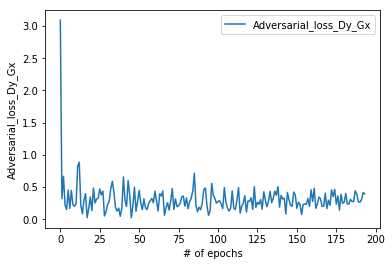

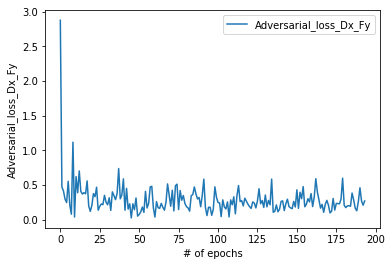

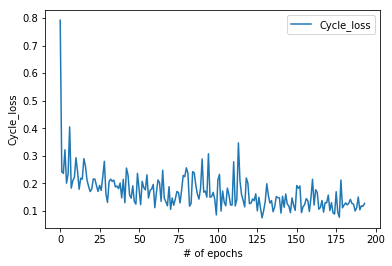

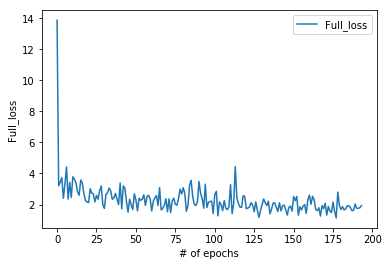

Advers_loss_Dy_Gx: 0.262 Advers_loss_Dx_Fy: 0.183 Cyc_loss: 0.096
[194, 0] G_loss: 1.400 Dx_loss: 0.335 Dy_loss: 0.380



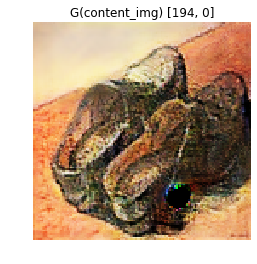

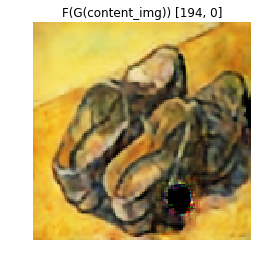

Advers_loss_Dy_Gx: 0.201 Advers_loss_Dx_Fy: 0.256 Cyc_loss: 0.161
[194, 50] G_loss: 2.069 Dx_loss: 0.212 Dy_loss: 0.259

Advers_loss_Dy_Gx: 0.202 Advers_loss_Dx_Fy: 0.069 Cyc_loss: 0.138
[194, 100] G_loss: 1.655 Dx_loss: 0.432 Dy_loss: 0.262



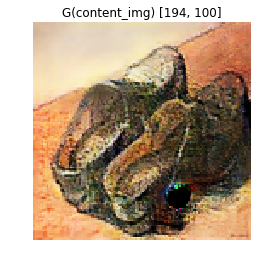

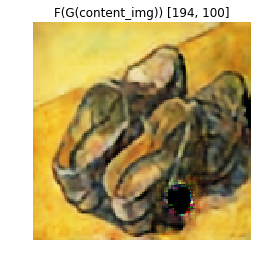

Advers_loss_Dy_Gx: 0.425 Advers_loss_Dx_Fy: 0.164 Cyc_loss: 0.104
[194, 150] G_loss: 1.627 Dx_loss: 0.175 Dy_loss: 0.337

Advers_loss_Dy_Gx: 0.244 Advers_loss_Dx_Fy: 0.359 Cyc_loss: 0.146
[194, 200] G_loss: 2.061 Dx_loss: 0.223 Dy_loss: 0.291



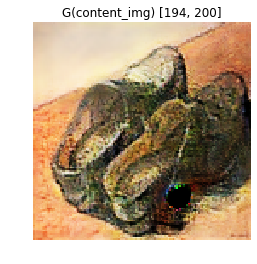

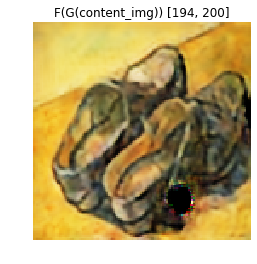

Advers_loss_Dy_Gx: 0.189 Advers_loss_Dx_Fy: 0.249 Cyc_loss: 0.104
[194, 250] G_loss: 1.481 Dx_loss: 0.245 Dy_loss: 0.316

Advers_loss_Dy_Gx: 0.351 Advers_loss_Dx_Fy: 0.195 Cyc_loss: 0.217
[194, 300] G_loss: 2.715 Dx_loss: 0.169 Dy_loss: 0.158



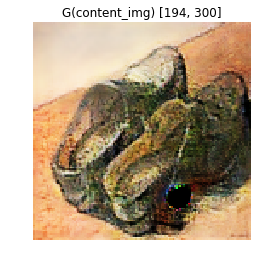

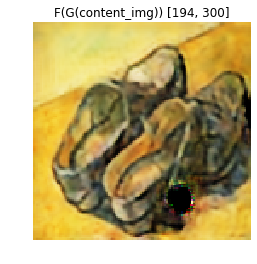

Advers_loss_Dy_Gx: 0.398 Advers_loss_Dx_Fy: 0.163 Cyc_loss: 0.131
[194, 350] G_loss: 1.873 Dx_loss: 0.226 Dy_loss: 0.193



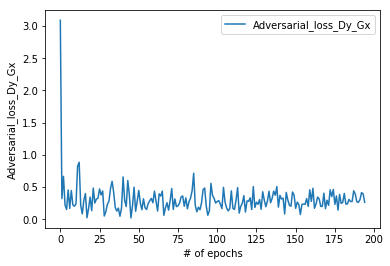

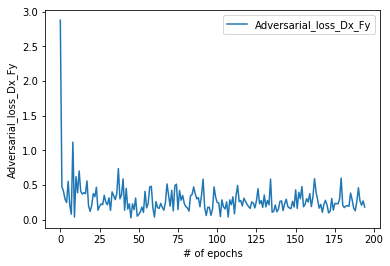

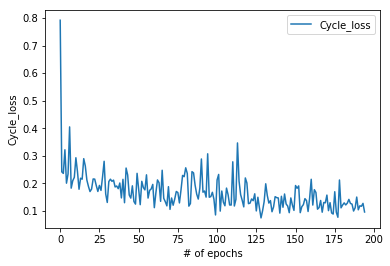

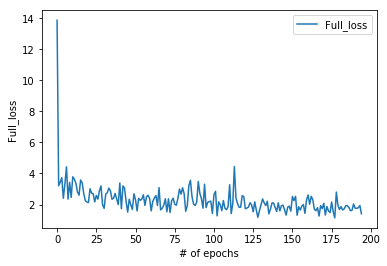

Advers_loss_Dy_Gx: 0.317 Advers_loss_Dx_Fy: 0.124 Cyc_loss: 0.143
[195, 0] G_loss: 1.875 Dx_loss: 0.226 Dy_loss: 0.221



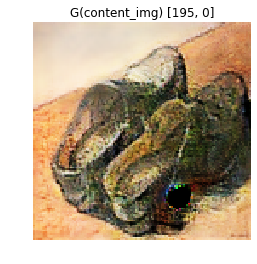

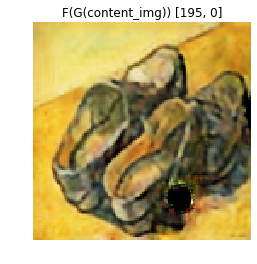

Advers_loss_Dy_Gx: 0.364 Advers_loss_Dx_Fy: 0.137 Cyc_loss: 0.105
[195, 50] G_loss: 1.551 Dx_loss: 0.253 Dy_loss: 0.318

Advers_loss_Dy_Gx: 0.386 Advers_loss_Dx_Fy: 0.223 Cyc_loss: 0.106
[195, 100] G_loss: 1.664 Dx_loss: 0.198 Dy_loss: 0.184



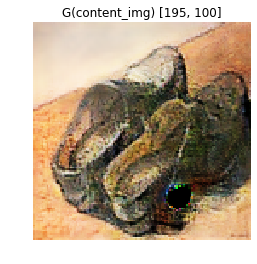

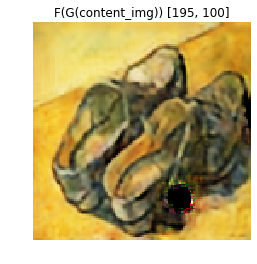

Advers_loss_Dy_Gx: 0.330 Advers_loss_Dx_Fy: 0.253 Cyc_loss: 0.121
[195, 150] G_loss: 1.791 Dx_loss: 0.222 Dy_loss: 0.112

Advers_loss_Dy_Gx: 0.131 Advers_loss_Dx_Fy: 0.212 Cyc_loss: 0.092
[195, 200] G_loss: 1.261 Dx_loss: 0.178 Dy_loss: 0.358



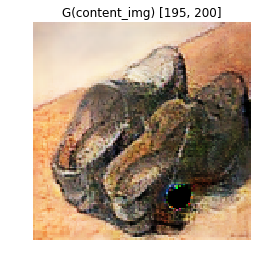

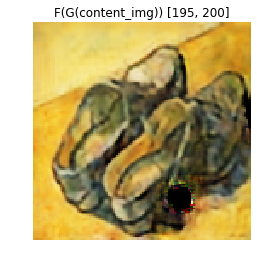

Advers_loss_Dy_Gx: 0.334 Advers_loss_Dx_Fy: 0.265 Cyc_loss: 0.111
[195, 250] G_loss: 1.713 Dx_loss: 0.264 Dy_loss: 0.242

Advers_loss_Dy_Gx: 0.249 Advers_loss_Dx_Fy: 0.182 Cyc_loss: 0.162
[195, 300] G_loss: 2.051 Dx_loss: 0.213 Dy_loss: 0.250



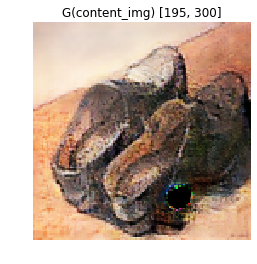

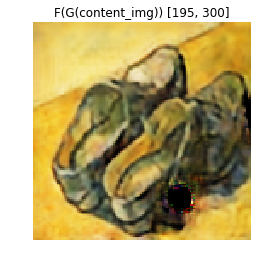

Advers_loss_Dy_Gx: 0.173 Advers_loss_Dx_Fy: 0.298 Cyc_loss: 0.077
[195, 350] G_loss: 1.244 Dx_loss: 0.204 Dy_loss: 0.200



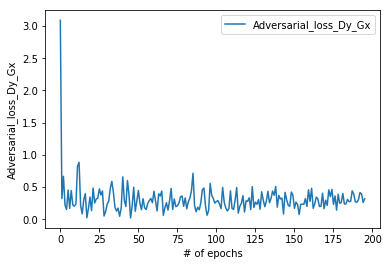

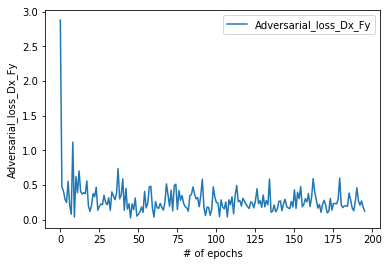

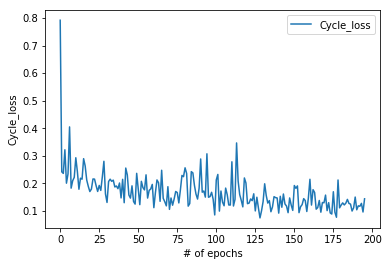

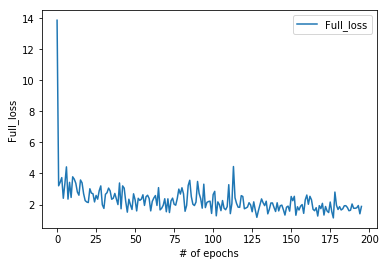

Advers_loss_Dy_Gx: 0.201 Advers_loss_Dx_Fy: 0.410 Cyc_loss: 0.112
[196, 0] G_loss: 1.735 Dx_loss: 0.282 Dy_loss: 0.227



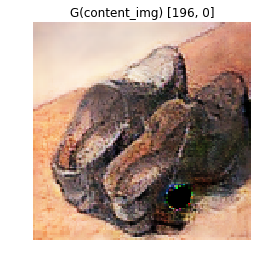

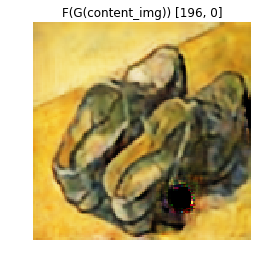

Advers_loss_Dy_Gx: 0.296 Advers_loss_Dx_Fy: 0.286 Cyc_loss: 0.092
[196, 50] G_loss: 1.506 Dx_loss: 0.188 Dy_loss: 0.156

Advers_loss_Dy_Gx: 0.276 Advers_loss_Dx_Fy: 0.280 Cyc_loss: 0.153
[196, 100] G_loss: 2.084 Dx_loss: 0.186 Dy_loss: 0.199



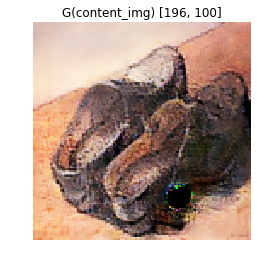

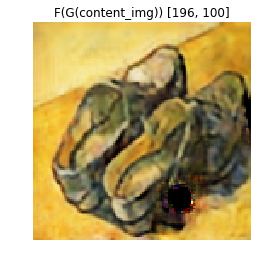

Advers_loss_Dy_Gx: 0.342 Advers_loss_Dx_Fy: 0.246 Cyc_loss: 0.128
[196, 150] G_loss: 1.872 Dx_loss: 0.172 Dy_loss: 0.117

Advers_loss_Dy_Gx: 0.257 Advers_loss_Dx_Fy: 0.642 Cyc_loss: 0.135
[196, 200] G_loss: 2.246 Dx_loss: 0.139 Dy_loss: 0.134



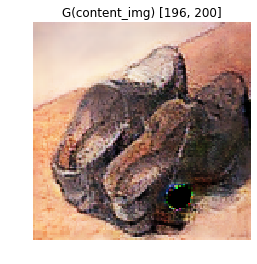

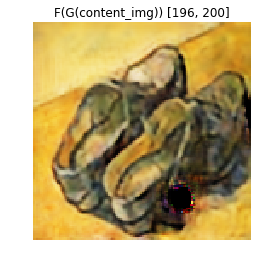

Advers_loss_Dy_Gx: 0.396 Advers_loss_Dx_Fy: 0.257 Cyc_loss: 0.150
[196, 250] G_loss: 2.155 Dx_loss: 0.358 Dy_loss: 0.213

Advers_loss_Dy_Gx: 0.120 Advers_loss_Dx_Fy: 0.280 Cyc_loss: 0.085
[196, 300] G_loss: 1.255 Dx_loss: 0.239 Dy_loss: 0.283



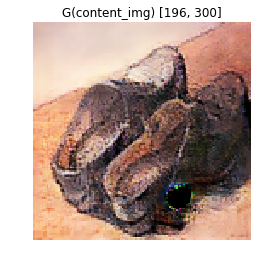

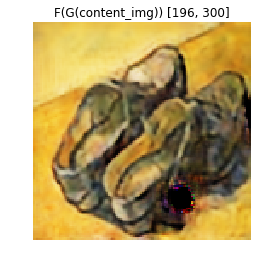

Advers_loss_Dy_Gx: 0.365 Advers_loss_Dx_Fy: 0.289 Cyc_loss: 0.095
[196, 350] G_loss: 1.608 Dx_loss: 0.123 Dy_loss: 0.147



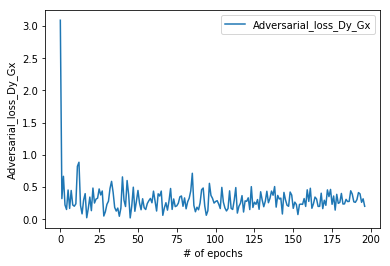

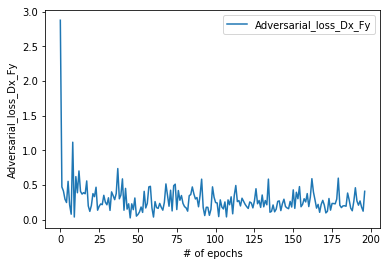

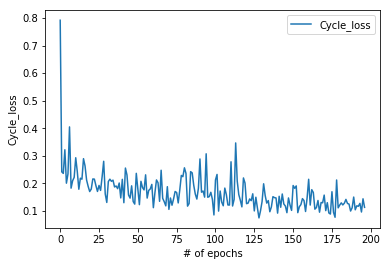

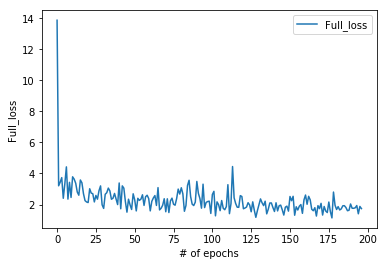

Advers_loss_Dy_Gx: 0.230 Advers_loss_Dx_Fy: 0.192 Cyc_loss: 0.137
[197, 0] G_loss: 1.793 Dx_loss: 0.258 Dy_loss: 0.211



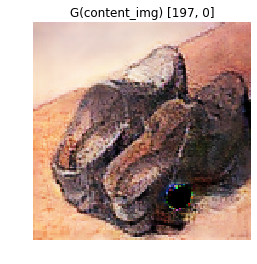

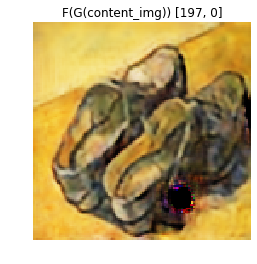

Advers_loss_Dy_Gx: 0.461 Advers_loss_Dx_Fy: 0.216 Cyc_loss: 0.117
[197, 50] G_loss: 1.845 Dx_loss: 0.226 Dy_loss: 0.223

Advers_loss_Dy_Gx: 0.224 Advers_loss_Dx_Fy: 0.315 Cyc_loss: 0.155
[197, 100] G_loss: 2.086 Dx_loss: 0.154 Dy_loss: 0.252



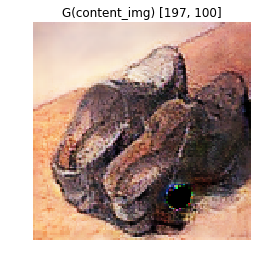

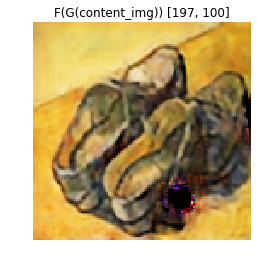

Advers_loss_Dy_Gx: 0.367 Advers_loss_Dx_Fy: 0.327 Cyc_loss: 0.120
[197, 150] G_loss: 1.891 Dx_loss: 0.171 Dy_loss: 0.238

Advers_loss_Dy_Gx: 0.344 Advers_loss_Dx_Fy: 0.290 Cyc_loss: 0.117
[197, 200] G_loss: 1.808 Dx_loss: 0.094 Dy_loss: 0.127



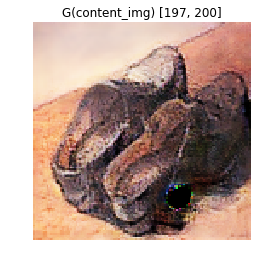

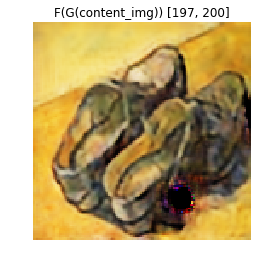

Advers_loss_Dy_Gx: 0.282 Advers_loss_Dx_Fy: 0.146 Cyc_loss: 0.128
[197, 250] G_loss: 1.712 Dx_loss: 0.197 Dy_loss: 0.268

Advers_loss_Dy_Gx: 0.279 Advers_loss_Dx_Fy: 0.232 Cyc_loss: 0.108
[197, 300] G_loss: 1.590 Dx_loss: 0.166 Dy_loss: 0.207



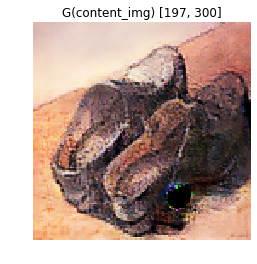

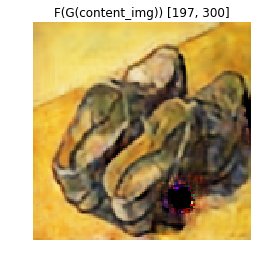

Advers_loss_Dy_Gx: 0.187 Advers_loss_Dx_Fy: 0.372 Cyc_loss: 0.101
[197, 350] G_loss: 1.572 Dx_loss: 0.249 Dy_loss: 0.127



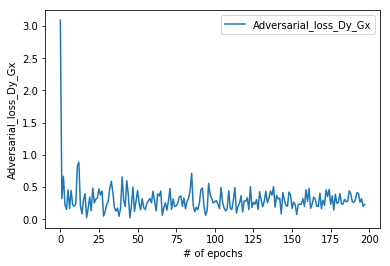

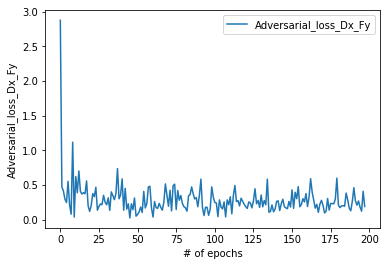

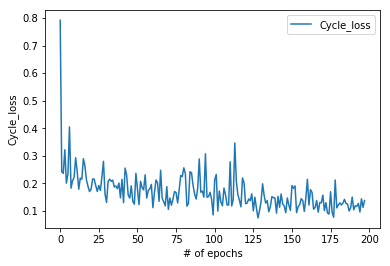

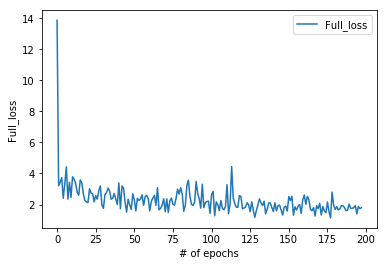

Advers_loss_Dy_Gx: 0.228 Advers_loss_Dx_Fy: 0.233 Cyc_loss: 0.082
[198, 0] G_loss: 1.281 Dx_loss: 0.199 Dy_loss: 0.204



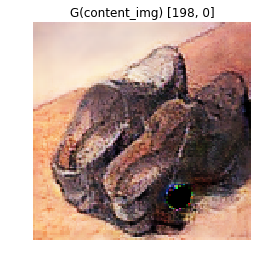

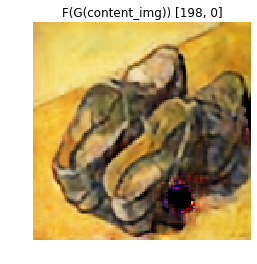

Advers_loss_Dy_Gx: 0.288 Advers_loss_Dx_Fy: 0.248 Cyc_loss: 0.095
[198, 50] G_loss: 1.484 Dx_loss: 0.101 Dy_loss: 0.198

Advers_loss_Dy_Gx: 0.249 Advers_loss_Dx_Fy: 0.149 Cyc_loss: 0.142
[198, 100] G_loss: 1.814 Dx_loss: 0.267 Dy_loss: 0.215



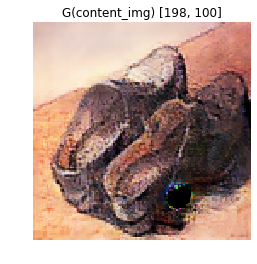

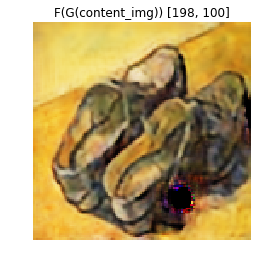

Advers_loss_Dy_Gx: 0.297 Advers_loss_Dx_Fy: 0.189 Cyc_loss: 0.109
[198, 150] G_loss: 1.575 Dx_loss: 0.229 Dy_loss: 0.194

Advers_loss_Dy_Gx: 0.111 Advers_loss_Dx_Fy: 0.350 Cyc_loss: 0.095
[198, 200] G_loss: 1.410 Dx_loss: 0.136 Dy_loss: 0.239



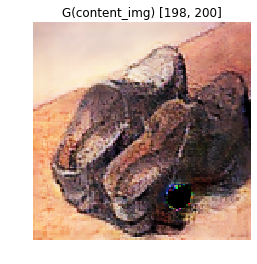

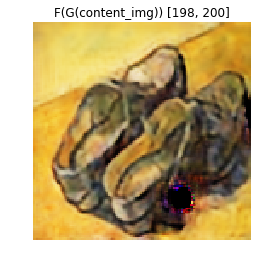

Advers_loss_Dy_Gx: 0.198 Advers_loss_Dx_Fy: 0.319 Cyc_loss: 0.083
[198, 250] G_loss: 1.345 Dx_loss: 0.168 Dy_loss: 0.246

Advers_loss_Dy_Gx: 0.221 Advers_loss_Dx_Fy: 0.340 Cyc_loss: 0.138
[198, 300] G_loss: 1.946 Dx_loss: 0.172 Dy_loss: 0.179



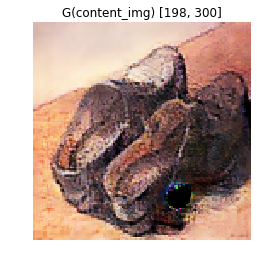

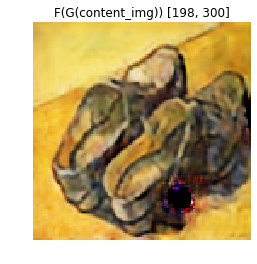

Advers_loss_Dy_Gx: 0.341 Advers_loss_Dx_Fy: 0.211 Cyc_loss: 0.171
[198, 350] G_loss: 2.263 Dx_loss: 0.242 Dy_loss: 0.190



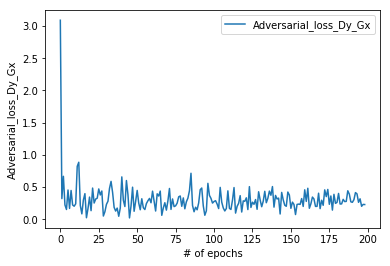

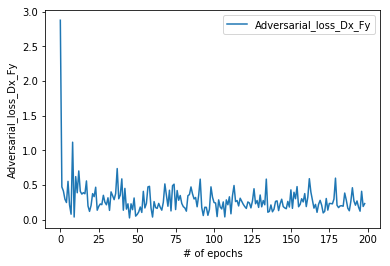

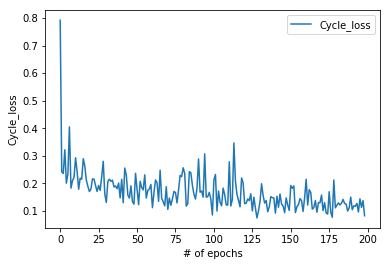

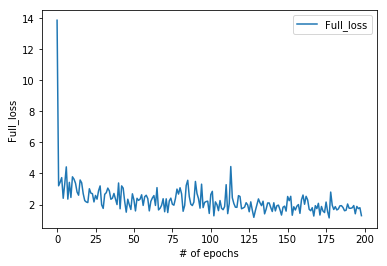

Advers_loss_Dy_Gx: 0.326 Advers_loss_Dx_Fy: 0.336 Cyc_loss: 0.122
[199, 0] G_loss: 1.884 Dx_loss: 0.273 Dy_loss: 0.164



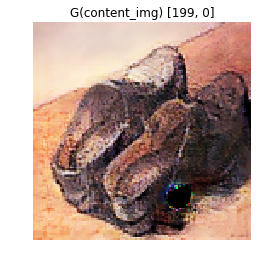

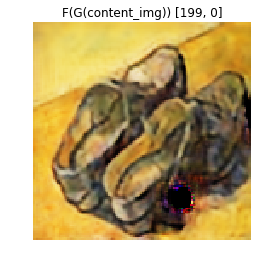

Advers_loss_Dy_Gx: 0.319 Advers_loss_Dx_Fy: 0.181 Cyc_loss: 0.123
[199, 50] G_loss: 1.729 Dx_loss: 0.248 Dy_loss: 0.289

Advers_loss_Dy_Gx: 0.193 Advers_loss_Dx_Fy: 0.288 Cyc_loss: 0.150
[199, 100] G_loss: 1.985 Dx_loss: 0.333 Dy_loss: 0.236



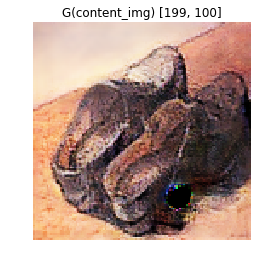

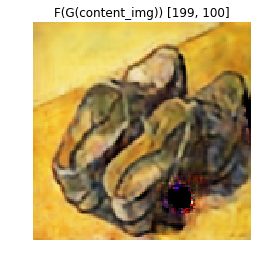

Advers_loss_Dy_Gx: 0.294 Advers_loss_Dx_Fy: 0.240 Cyc_loss: 0.147
[199, 150] G_loss: 2.000 Dx_loss: 0.254 Dy_loss: 0.241

Advers_loss_Dy_Gx: 0.345 Advers_loss_Dx_Fy: 0.177 Cyc_loss: 0.140
[199, 200] G_loss: 1.920 Dx_loss: 0.148 Dy_loss: 0.228



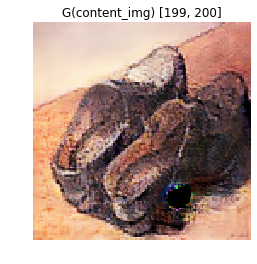

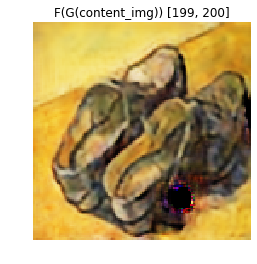

Advers_loss_Dy_Gx: 0.293 Advers_loss_Dx_Fy: 0.228 Cyc_loss: 0.146
[199, 250] G_loss: 1.976 Dx_loss: 0.220 Dy_loss: 0.118

Advers_loss_Dy_Gx: 0.352 Advers_loss_Dx_Fy: 0.278 Cyc_loss: 0.103
[199, 300] G_loss: 1.663 Dx_loss: 0.190 Dy_loss: 0.344



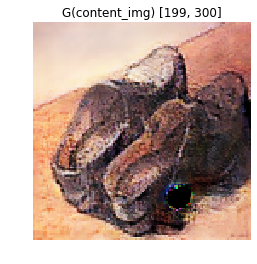

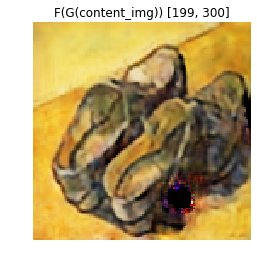

Advers_loss_Dy_Gx: 0.255 Advers_loss_Dx_Fy: 0.194 Cyc_loss: 0.103
[199, 350] G_loss: 1.478 Dx_loss: 0.250 Dy_loss: 0.253



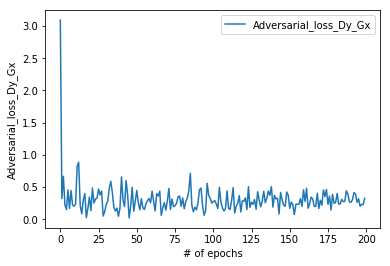

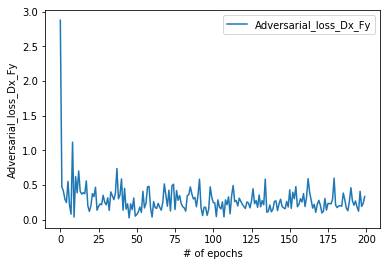

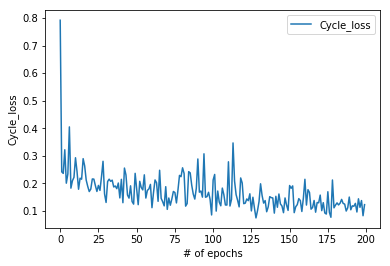

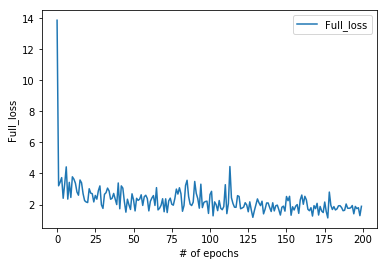

(Generator(
   (model): Sequential(
     (0): ReflectionPad2d((3, 3, 3, 3))
     (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
     (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
     (3): ReLU()
     (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
     (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
     (6): ReLU()
     (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
     (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
     (9): ReLU()
     (10): ResidualBlock(
       (model): Sequential(
         (0): ReflectionPad2d((1, 1, 1, 1))
         (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
         (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
         (3): ReLU()
         (4): ReflectionPad2d((1, 1, 1, 1))
         (5): Conv2d(256, 256, kernel_size=

In [26]:
backprop_deep(G, F, D_X, D_Y, vangogh_loader, photo_loader, start=epoch+1)

In [27]:
saving_dir = 'cycle_gan_vangogh2photo/final_model_'
torch.save(G, saving_dir+'G')
torch.save(F, saving_dir+'F')

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type ResidualBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
